In [ ]:
from google.cloud import bigquery
from google.colab import data_table
import bigframes.pandas as bpd
import bigframes

project = 'tech-challenge-3-group-20' # Project ID inserted based on the query results selected to explore
location = 'US' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()

# Set the BigQuery project ID in BigFrames options
bigframes.options.bigquery.project = project

#Connect to Google Drive - BigQuery

In [ ]:
!pip install google-cloud-bigquery pandas pyarrow

In [ ]:
#Authenticate with your Google Cloud credentials:
from google.colab import auth
auth.authenticate_user()

print("Authenticated successfully!")

Authenticated successfully!


## Reference SQL syntax from the original job
Use the ```jobs.query```
[method](https://cloud.google.com/bigquery/docs/reference/rest/v2/jobs/query) to
return the SQL syntax from the job. This can be copied from the output cell
below to edit the query now or in the future. Alternatively, you can use
[this link](https://console.cloud.google.com/bigquery?j=tech-challenge-3-group-20:US:bquxjob_1c803b23_193e06c570d)
back to BigQuery to edit the query within the BigQuery user interface.

In [ ]:
# Running this code will display the query used to generate your previous job (Personal Coding)

# job = client.get_job('bquxjob_1c803b23_193e06c570d') # Job ID inserted based on the query results selected to explore
job = client.get_job('bquxjob_fa05b1f_193e096a26a') # Job ID inserted based on the query results selected to explore

print(job.query)

  select 
        Indicador As Ind,
        `Nível Territorial` as Nivel,
        `Abertura Territorial` as UF,
        `Variável de abertura 1` as Var1,
        `Categoria de abertura 1` as Cat1,
        `Variável de abertura 2` as Var2,
        `Categoria de abertura 2` as Cat2,
        Setembro AS `Set`,   
        Outubro AS Out,
        Novembro AS Nov         
  from `tech-challenge-3-group-20.dataset_saude_202011.table_saude_202011`

      where Indicador in
          (
            -- Comportamento da população na época da COVID-19;
            'Pessoas ocupadas (mil pessoas)', -- OK
                'Pessoas ocupadas e não afastadas do trabalho, que trabalhavam de forma remota (mil pessoas)', -- OK
                'Pessoas ocupadas e afastadas do trabalho que tinham devido ao distanciamento social (mil pessoas)', -- OK
                'Pessoas desocupadas (mil pessoas)', -- OK
                'Pessoas não ocupadas que não procuraram trabalho por conta da pandemia ou por falta de

# Result set loaded from BigQuery job as a DataFrame
Query results are referenced from the Job ID ran from BigQuery and the query
does not need to be re-run to explore results. The ```to_dataframe```
[method](https://googleapis.dev/python/bigquery/latest/generated/google.cloud.bigquery.job.QueryJob.html#google.cloud.bigquery.job.QueryJob.to_dataframe)
downloads the results to a Pandas DataFrame by using the BigQuery Storage API. The read_gbq_table [method](https://cloud.google.com/python/docs/reference/bigframes/latest/bigframes.pandas#bigframes_pandas_read_gbq_function) turns a BigQuery table into the BigFrames DataFrame.

To edit query syntax, you can do so from the BigQuery SQL editor or in the
```Optional:``` sections below.

##BigQuery Data Retrieval: Job-Based vs. Direct Query"


In [ ]:
# Running this code will read results from your previous job (personal google drive/bigquery)
# job = client.get_job('bquxjob_fa05b1f_193e096a26a') # Job ID inserted based on the query results selected to explore

try:
  #A tabela temporária criada por este job ficará acessível por 24 horas após sua execução.
  job = client.get_job('bquxjob_e63cbe5_193e5f0be55')
  destination = job.destination

  # Load data from a BigQuery table using BigFrames DataFrames:
  bq_df = bpd.read_gbq(f"{destination.project}.{destination.dataset_id}.{destination.table_id}")
  bq_df
except Exception as e:
  # Assuming 'job' is a QueryJob object, e.g., from client.get_job()
  query = job.query

  # Configure query job to write to a temporary table
  query_job_config = bigquery.QueryJobConfig(
      destination=None,  # Use None for temporary table
      write_disposition="WRITE_TRUNCATE"  # Replace existing table if it exists
  )

  # Execute the query
  query_job = client.query(query, job_config=query_job_config)

  # Get temporary table destination details
  destination = query_job.destination

  # Load the temporary table into a BigFrames DataFrame
  bq_df = bpd.read_gbq(f"{destination.project}.{destination.dataset_id}.{destination.table_id}")

##Data from a Personal BigQuery Project (Made Publicly Accessible)


### Public accessing the bigquery datasets and tables created under the project ' Tech-Challenge-3-Group-20'

In [ ]:
#Public access permissions were granted to the datasets and tables,
#enabling access without the need for credentials.

project = 'tech-challenge-3-group-20' # Project ID inserted based on the query results selected to explore
location = 'US' # Location inserted based on the query results selected to explore
# location = 'southamerica-east1' #Location was updated to SP


client_public = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()


# Define the query (replace with your public dataset and query)
query = """
SELECT *
FROM `tech-challenge-3-group-20.dataset_saude_202011.table_saude_202011`
LIMIT 10
"""

# Execute the query
query_job = client_public.query(query)

# Print the results
for row in query_job.result():
    print(row)

Row(('Pessoas que apresentaram algum dos sintoma(s) (mil pessoas)', 'Unidade da Federação', 'Rondônia', '-', '-', '-', '-', 181.9433302282497, 134.2709226283672, 91.12000626739963, 96.64158461057383, 77.54838516098494, 51.14491652556072, 41.35750142152041), {'Indicador': 0, 'Nível Territorial': 1, 'Abertura Territorial': 2, 'Variável de abertura 1': 3, 'Categoria de abertura 1': 4, 'Variável de abertura 2': 5, 'Categoria de abertura 2': 6, 'Maio': 7, 'Junho': 8, 'Julho': 9, 'Agosto': 10, 'Setembro': 11, 'Outubro': 12, 'Novembro': 13})
Row(('CV - Pessoas que apresentaram algum dos sintoma(s) (%)', 'Unidade da Federação', 'Rondônia', '-', '-', '-', '-', 8.318182339551573, 7.469208424151498, 8.93785398463679, 10.752584035663313, 11.760041318230584, 14.545604700767328, 15.459793921709117), {'Indicador': 0, 'Nível Territorial': 1, 'Abertura Territorial': 2, 'Variável de abertura 1': 3, 'Categoria de abertura 1': 4, 'Variável de abertura 2': 5, 'Categoria de abertura 2': 6, 'Maio': 7, 'Junho

In [ ]:
# Running this code will read results from your previous job (personal google drive/bigquery)

job = client_public.get_job('bquxjob_fa05b1f_193e096a26a') # Job ID inserted based on the query results selected to explore

# Assuming 'job' is a QueryJob object, e.g., from client.get_job()
query = job.query

# Configure query job to write to a temporary table
query_job_config = bigquery.QueryJobConfig(
    destination=None,  # Use None for temporary table
    write_disposition="WRITE_TRUNCATE"  # Replace existing table if it exists
)

# Execute the query
query_job = client.query(query, job_config=query_job_config)

# Get temporary table destination details
destination = query_job.destination

# Load the temporary table into a BigFrames DataFrame
bq_df_public = bpd.read_gbq(f"{destination.project}.{destination.dataset_id}.{destination.table_id}")

## Show descriptive statistics using describe()
Use the ```DataFrame.describe()```
[method](https://cloud.google.com/python/docs/reference/bigframes/latest/bigframes.dataframe.DataFrame#bigframes_dataframe_DataFrame_describe)
to generate descriptive statistics. Descriptive statistics include those that
summarize the central tendency, dispersion and shape of a dataset’s
distribution, excluding ```NaN``` values. You may also use other Python methods
to interact with your data.

In [ ]:
bq_df.describe()

,Set,Out,Nov
count,2758.0,2758.0,2758.0
mean,501.279722,522.455677,539.808395
std,1810.559702,1855.638957,1867.422428
min,0.732293,0.707738,0.203304
25%,36.160266,36.711493,40.419912
50%,105.387518,109.17327,118.772281
75%,325.183691,334.58161,366.666549
max,53774.383911,54979.01661,54840.222753


In [ ]:
bq_df_public.describe()

,Set,Out,Nov
count,2758.0,2758.0,2758.0
mean,501.279722,522.455677,539.808395
std,1810.559702,1855.638957,1867.422428
min,0.732293,0.707738,0.203304
25%,36.160266,36.711493,40.419912
50%,105.387518,109.17327,118.772281
75%,325.183691,334.58161,366.666549
max,53774.383911,54979.01661,54840.222753


In [ ]:
# Convert BigQuery DataFrame to pandas DataFrame.
#Data Loading Strategy: Attempting to Load Data from Personal BigQuery Job; Using
#Public Job approach as a Fallback

try:
  df = bq_df.to_pandas()
  df_original = bq_df.to_pandas() #Keep the original data
except Exception as e:  # Catch any potential errors
  print(f"Error converting bq_df to pandas DataFrame: {e}")
  try:
    df = bq_df_public.to_pandas()
    df_original = bq_df_public.to_pandas()  # Keep the original data
    print("Using bq_df_public as fallback.")
  except Exception as e2:
    print(f"Error converting bq_df_public to pandas DataFrame: {e2}")
    # Handle the case where both conversions fail
    # For example, raise an exception or assign default values to df and df_original

# Importando as bibliotecas Python para análise e modelagem

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import matplotlib.ticker as ticker
from matplotlib.ticker import FuncFormatter
import matplotlib.ticker as mticker

In [ ]:
# # prompt: download df to local machine in excel format

# from google.colab import files
# bq_df.to_excel('downloaded_df.xlsx', index=False)
# files.download('downloaded_df.xlsx')

In [ ]:
# Generate descriptive statistics - Standard DF
df.describe()

,Set,Out,Nov
count,2758.0,2758.0,2758.0
mean,501.279722,522.455677,539.808395
std,1810.559702,1855.638957,1867.422428
min,0.732293,0.707738,0.203304
25%,36.187389,36.782363,40.645767
50%,106.547149,109.416874,120.227051
75%,318.164025,337.269207,363.866072
max,53774.383911,54979.01661,54840.222753


#Características clínicas dos sintomas / Caracterização dos sintomas clínicos da população

In [ ]:
# Building a DataFrame of Clinical Symptoms from DF
df = df_original #Copy original DF data
# Filter the DataFrame
Sintomas_Clinicos_df = df[(df['Nivel'] == 'País') & (df['UF'] == 'Brasil')]

# Lista de valores para iteração
var1_values = [
                'Cor ou Raça',
                'Grupos de Idade',
                'Grupos de Idade 2',
                'Nível de instrução ',
                'Sexo'
              ]

# Dicionário para armazenar os resultados
result_dfs = {}

# Loop para criar DataFrames filtrados
for var1 in var1_values:
    filtered_df = Sintomas_Clinicos_df[Sintomas_Clinicos_df['Var1'] == var1]
    result_dfs[var1] = filtered_df  # Salvar no dicionário

# Dicionário para substituições - Para facilitar leitura da legenda
replace_dict = {
    'Pessoas que apresentaram o sintoma de perda de cheiro ou de sabor (mil pessoas)': 'Perda de cheiro ou de sabor (mil pessoas)',
    'Pessoas que apresentaram os sintomas de tosse, febre e dificuldade para respirar (mil pessoas) ': 'Tosse, febre e dificuldade para respirar (mil pessoas)',
    'Pessoas que apresentaram os sintomas de tosse, febre e dor no peito (mil pessoas)': 'Tosse, febre e dor no peito (mil pessoas)'
}

In [ ]:
# Loop para criar os gráficos para de as variáveis de característica clínica e da população disponíveis na análise pelo nível nacional/Brasil
for var1 in var1_values:
  # Dados para o DataFrame
  df = result_dfs[var1]

  # Ordenar o DataFrame por 'UF' em ordem crescente
  df = df.sort_values(by=['Var1','Cat1','Set','Out','Nov'], ascending=True)

  # Filtrar linhas onde Cat1 não é 'Total4' ou 'Total' - Remove o valor total da tabela de dados colunar
  df = df[df['Cat1'] != 'Total4']
  df = df[df['Cat1'] != 'Total']

  # Substituindo os valores na coluna 'Ind'
  df['Ind'] = df['Ind'].replace(replace_dict)

  # Configurar os meses como categorias no eixo X
  months = ['Set', 'Out', 'Nov']
  x = np.arange(len(months))  # Índices para os meses
  width = 0.6  # Largura das barras

  # Iterar sobre cada valor único de 'Cat1'
  for cat1 in df['Cat1'].unique():
      # Filtrar o DataFrame para a categoria atual
      subset_cat1 = df[df['Cat1'] == cat1]

      # Inicializar os valores de "bottom" para empilhar as barras
      bottom_values = np.zeros(len(months))

      # Criar o gráfico
      fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

      # Plotar barras empilhadas para cada categoria de 'Ind'
      for ind in subset_cat1['Ind'].unique():
          subset_ind = subset_cat1[subset_cat1['Ind'] == ind]
          values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
          bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

          # Adicionar rótulos de dados verticalmente alinhados ao centro
          for bar in bars:
              ax.text(
                  bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
                  bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
                  f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
                  ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
              )

          # Atualizar os valores do "bottom" para a próxima categoria
          bottom_values += values

      # Adicionar título, rótulos e legendas
      ax.set_xlabel('Meses')
      ax.set_ylabel('')
      ax.set_title(f'Análise por {var1}: "{cat1}"')
      ax.set_xticks(x)
      ax.set_xticklabels(months)
      ax.legend(title='')


      # Ajustar os limites do eixo X para deslocar as barras à esquerda
      ax.set_xlim(-1, len(months) - 0.5)

      # Posicionar a legenda na parte direita do gráfico
      ax.legend(title='', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

      # Configurar separador de milhar como ponto no eixo Y
      ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',', '.')))

      # Ajustar margens do gráfico
      plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

      # Ajustar layout e exibir o gráfico
      plt.tight_layout()
      plt.show()

#Sintomas Conjugados de COVID-19: Tiveram perda de cheiro ou sabor ou tosse, febre e dificuldade para respirar ou febre, tosse e dor no peito.


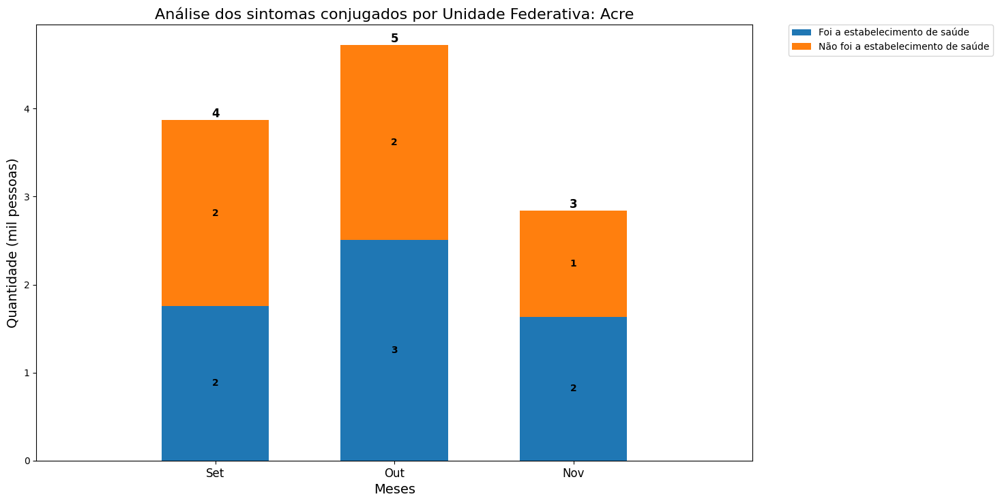

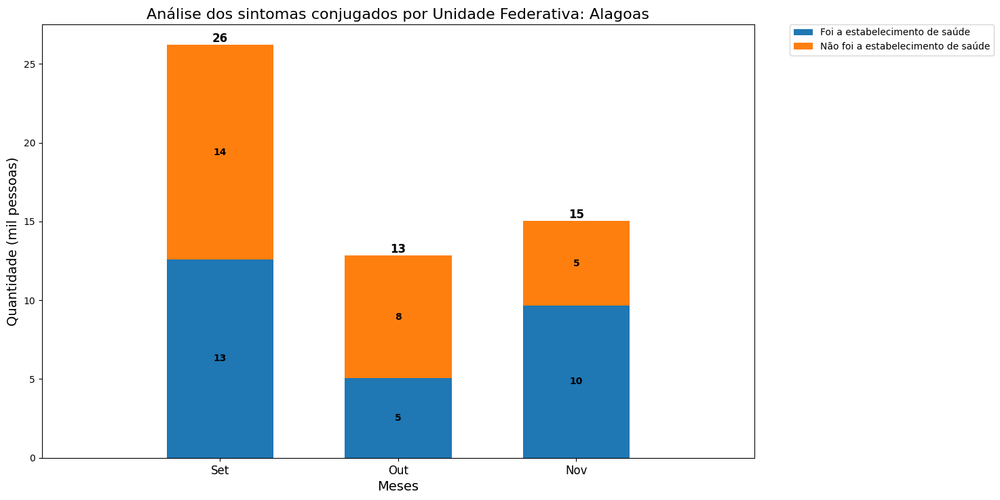

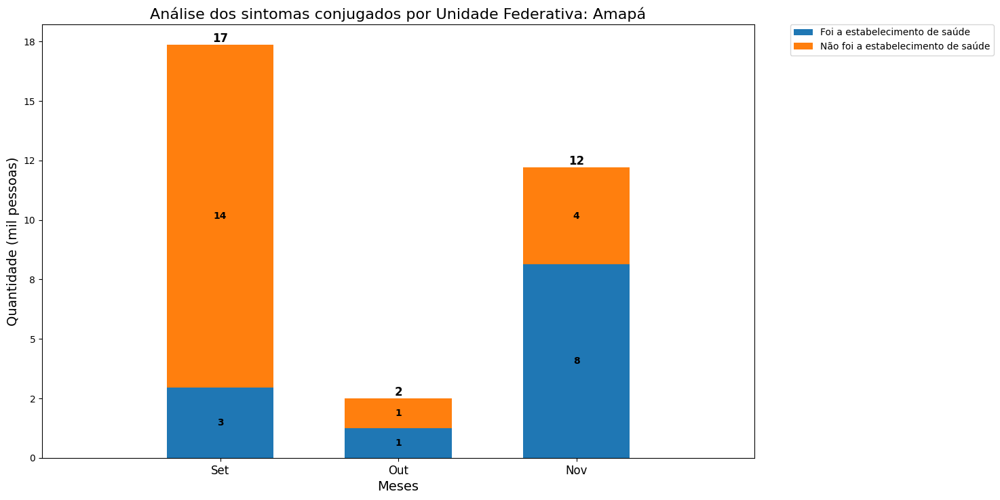

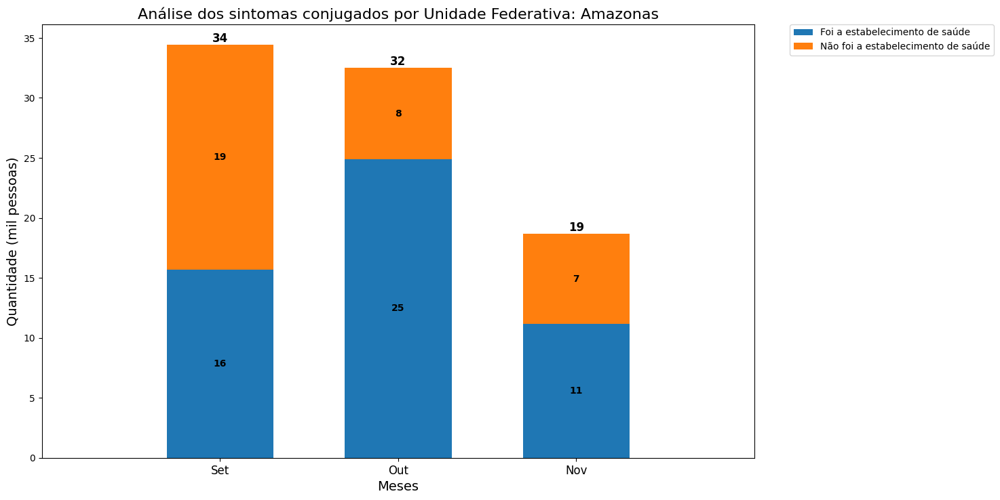

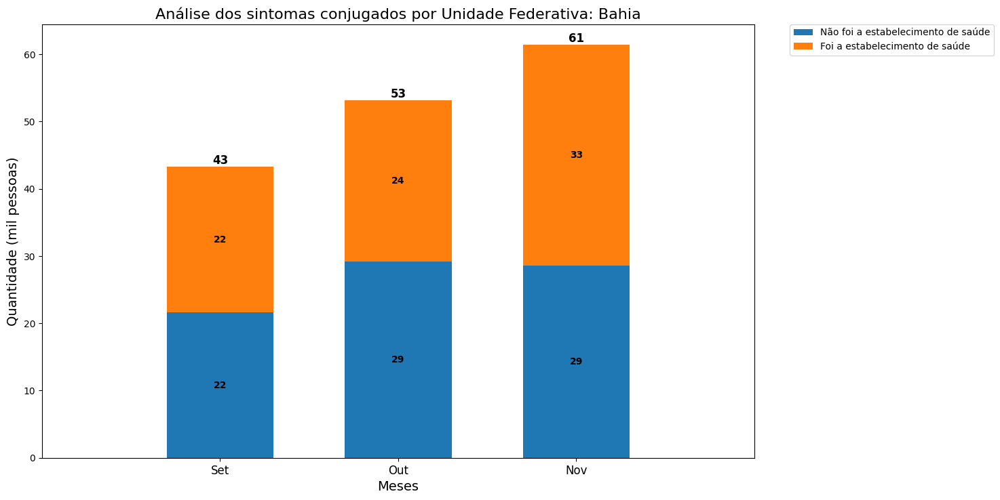

...

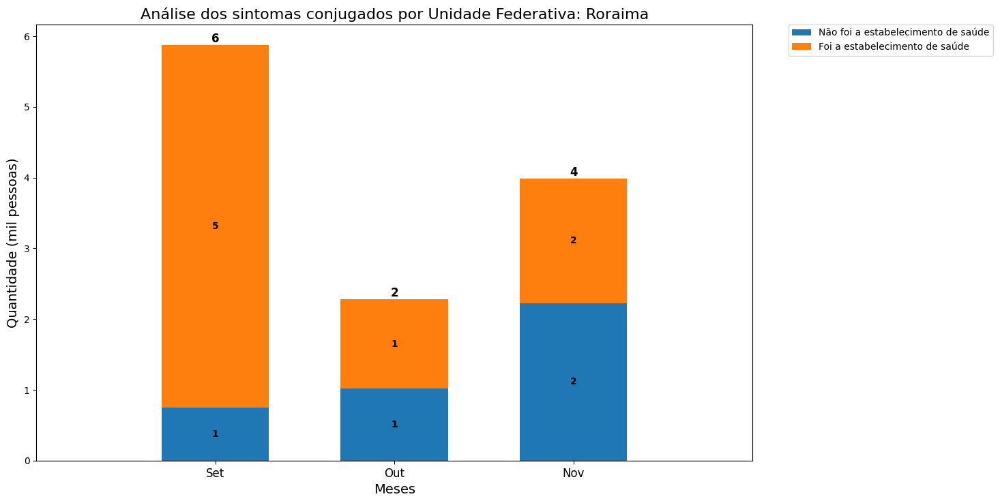

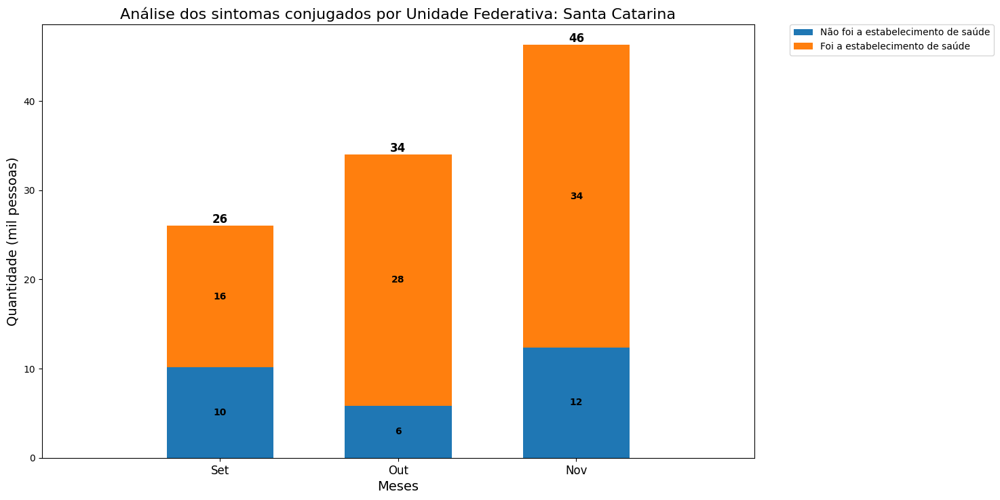

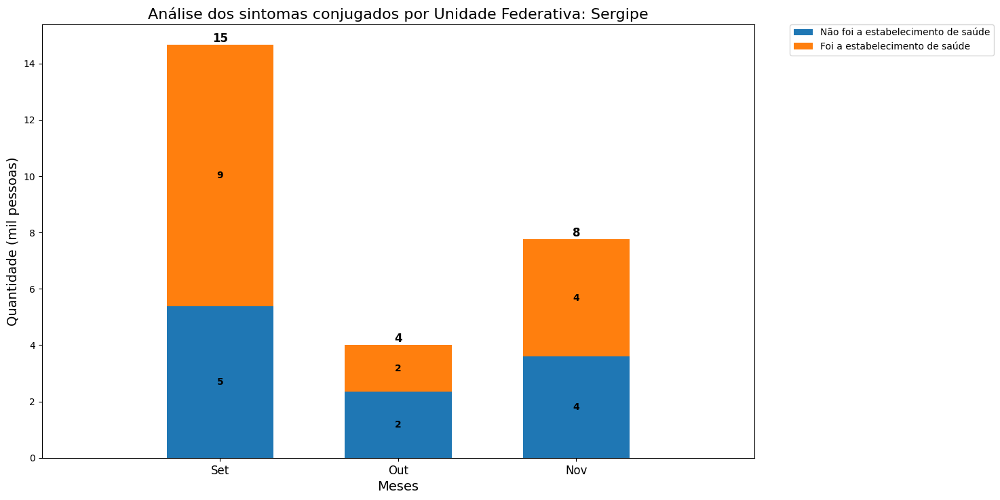

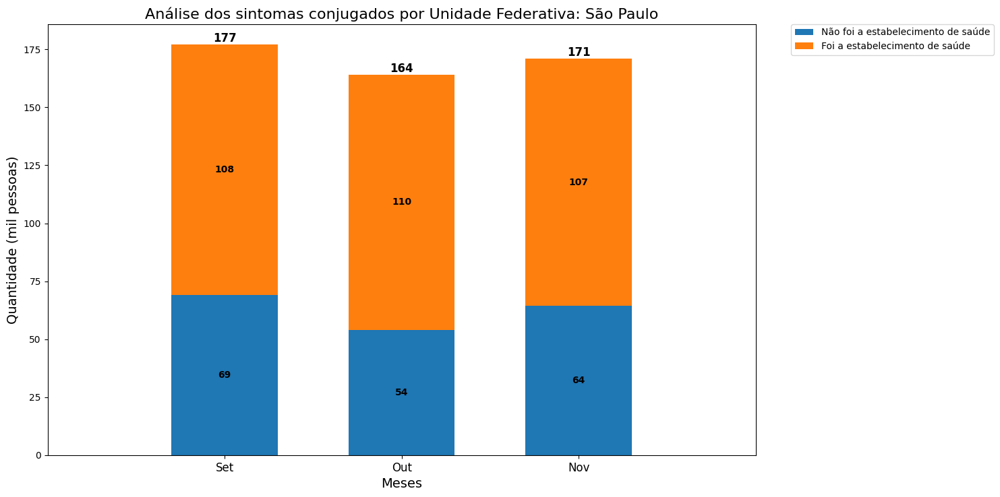

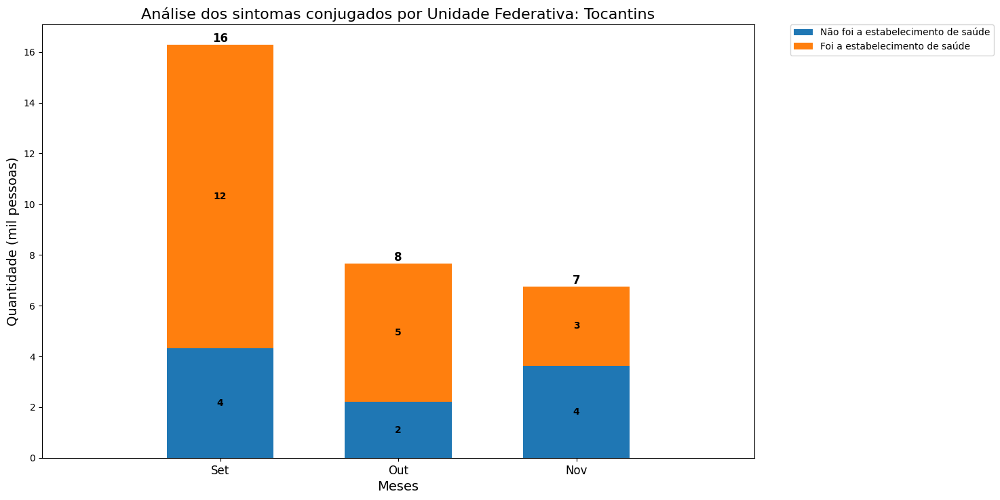

In [ ]:
#Nota 3: Considera-se que apresentou sintomas conjugados as pessoas que tiveram perda de cheiro ou sabor ou tosse, febre e dificuldade
#para respirar ou febre, tosse e dor no peito.
# Análise de dados utilizando somente o índice 'Pessoas que apresentaram sintomas referenciados conjugados3 (mil pessoas)'
# Loop para criar os gráficos para todos os UF

# Dados para o DataFrame
df = df_original[(df_original['Ind'] == 'Pessoas que apresentaram sintomas referenciados conjugados3 (mil pessoas)')]

# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
df = df[df['Cat2'] != 'Total']
df = df[df['Cat2'] != '-']

# Iterar sobre cada valor único de 'UF'

for cat1 in df['UF'].unique():
    # Filter the DataFrame for the current category
    subset_cat1 = df[df['UF'] == cat1]

    # Create the plot
    fig, ax = plt.subplots(figsize=(15, 8))

    # Initialize bottom values for stacking
    bottom_values = np.zeros(len(months))

    # Plot stacked bars for each 'Cat2'
    for ind in subset_cat1['Cat2'].unique():
        subset_ind = subset_cat1[subset_cat1['Cat2'] == ind]
        values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Monthly values

        bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

        # Add labels on the individual stacked bars
        for bar in bars:
            ax.text(
                bar.get_x() + bar.get_width() / 2,  # Center horizontally
                bar.get_y() + bar.get_height() / 2,  # Center vertically
                f'{bar.get_height():.0f}',  # Format with no decimal places
                ha='center', va='center', fontsize=10, weight='bold'
            )

        # Update bottom values for the next stacked bar
        bottom_values += values

    # Add total labels at the top of the stack
    for i, total in enumerate(bottom_values):
        ax.text(
            x[i], total + 0,  # Position above the stack
            f'{total:.0f}',  # Total formatted as an integer
            ha='center', va='bottom', fontsize=12, weight='bold', color='black'
        )

    # Add title, labels, and legend
    ax.set_xlabel('Meses', fontsize=14)
    ax.set_ylabel('Quantidade (mil pessoas)', fontsize=14)
    ax.set_title(f'Análise dos sintomas conjugados por Unidade Federativa: {cat1}', fontsize=16)
    ax.set_xticks(x)
    ax.set_xticklabels(months, fontsize=12)

    # Adjust x-axis limits to provide space
    ax.set_xlim(-1, len(months))

    # Position legend on the right
    ax.legend(title='', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

    # Format y-axis with thousand separator
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',', '.')))

    # Adjust layout and display the plot
    plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)
    plt.show()

#Características da população - Comparativo entre Ocupados e Desocupados

##Distribuição da Força de Trabalho por Unidade Federativa e Setor

In [ ]:
# Building a DataFrame of Busy/ Not busy - Ocupados/Desocupadosfrom DF
# Filter the DataFrame
df = df_original #Copy original DF data
Ocupados_Desocupados_df = df[(df['Nivel'] == 'Unidade da Federação')]

# Lista de valores para iteração
var1_values = [
              'Condição de afastamento',
              'Cor ou Raça',
              'Grupamentos de atividade',
              'Grupamentos ocupacionais',
              'Grupos de Idade',
              'Grupos de Idade 2',
              'Nível de instrução',
              'Posição na ocupação e categoria do emprego',
              'Rendimento real domiciliar per capita efetivamente recebido',
              'Sexo'
               ]

# Dicionário para armazenar os resultados
result_dfs = {}

# Loop para criar DataFrames filtrados
for var1 in var1_values:
    filtered_df = Ocupados_Desocupados_df[Ocupados_Desocupados_df['Var1'] == var1]
    result_dfs[var1] = filtered_df  # Salvar no dicionário

    # Dicionário para substituições - Para facilitar leitura da legenda
replace_dict = {
            'Pessoas ocupadas (mil pessoas)':'Pessoas ocupadas (mil pessoas)',
            'Pessoas ocupadas e não afastadas do trabalho, que trabalhavam de forma remota (mil pessoas)':'Trabalhadores remotos não afastados (mil pessoas)',
            'Pessoas ocupadas e afastadas do trabalho que tinham devido ao distanciamento social (mil pessoas)':'Afastados por distanciamento social (mil pessoas):',
            'Pessoas desocupadas (mil pessoas)':'Pessoas desocupadas (mil pessoas)',
            'Pessoas não ocupadas que não procuraram trabalho por conta da pandemia ou por falta de trabalho na localidade, mas que gostariam de trabalhar na semana anterior (mil pessoas)':'Disponíveis, mas não procuraram emprego (mil pessoas):',
            'Pessoas na força de trabalho (mil pessoas)':'Pessoas na força de trabalho (mil pessoas)', #Não será usado por falta de detalhamento da população
            'Pessoas que apresentaram sintomas referenciados conjugados3 (mil pessoas)':'Apresentaram sintomas referenciados conjugados3 (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus (mil pessoas)':'Fizeram teste para Coronavírus (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus e testaram positivo (mil pessoas) ':'Testaram positivo para Coronavírus (mil pessoas)',
            'Massa de rendimento médio real efetivamente recebido de todos os trabalhos das pessoas ocupadas com rendimento do trabalho (milhões de R$)':'Rendimento médio real total (milhões de R$)'
            }

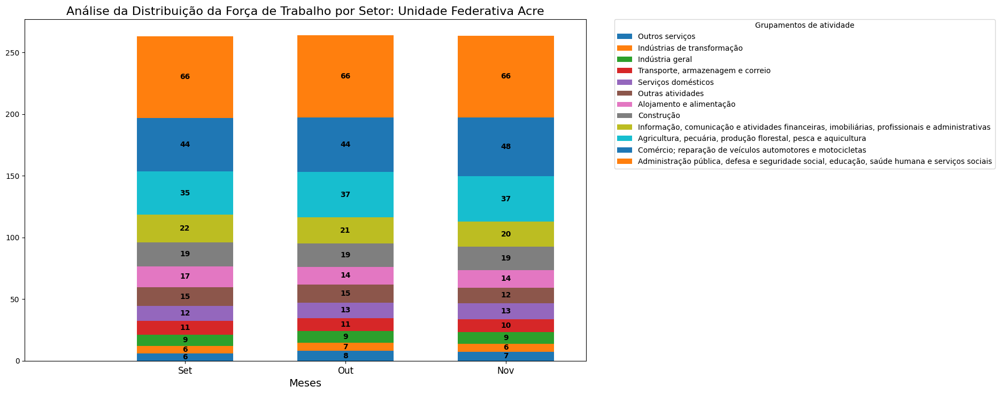

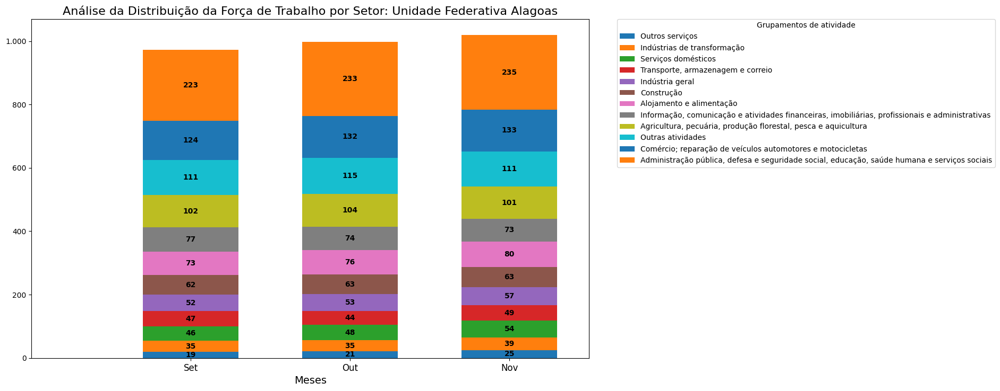

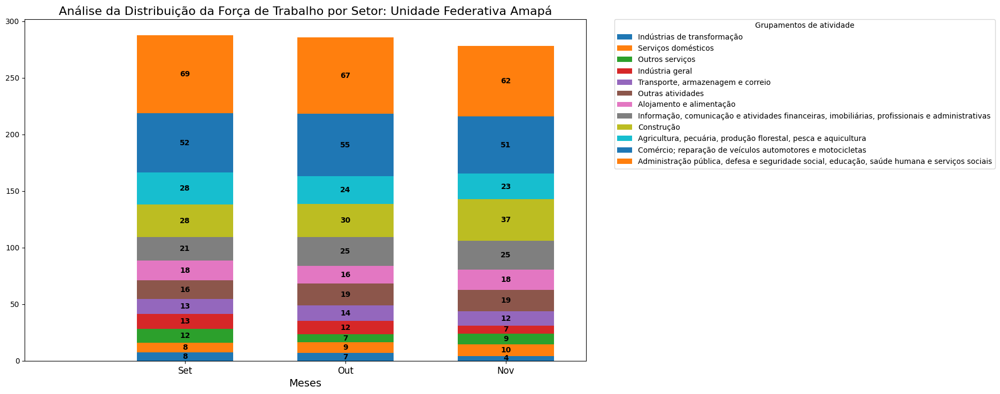

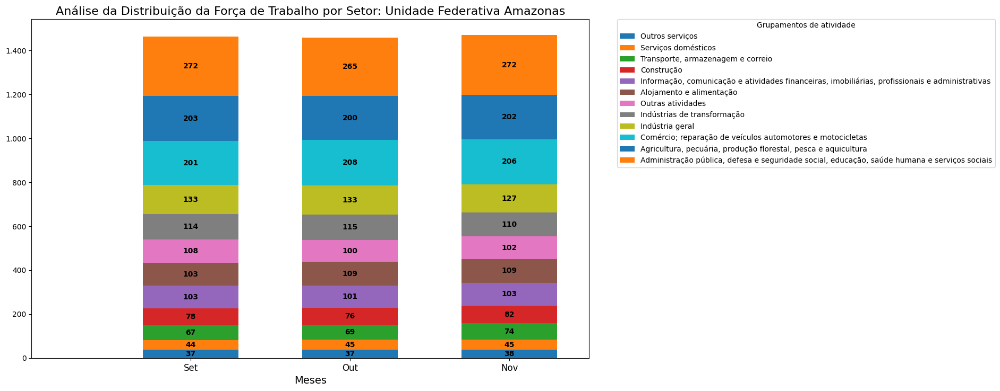

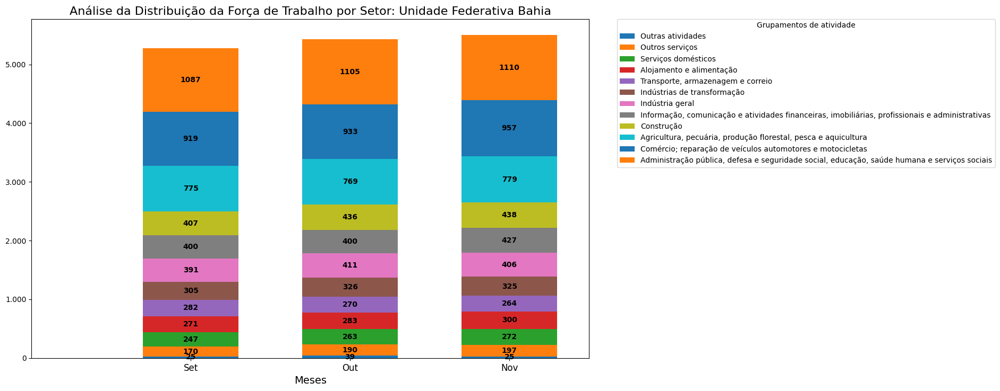

...

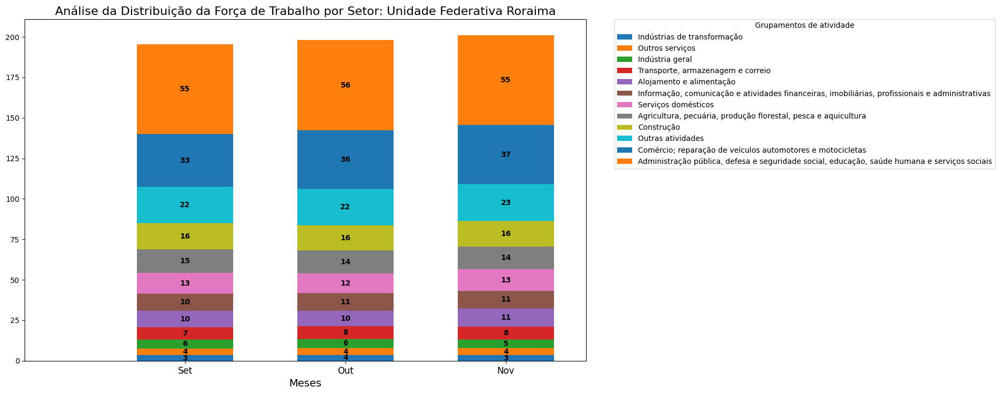

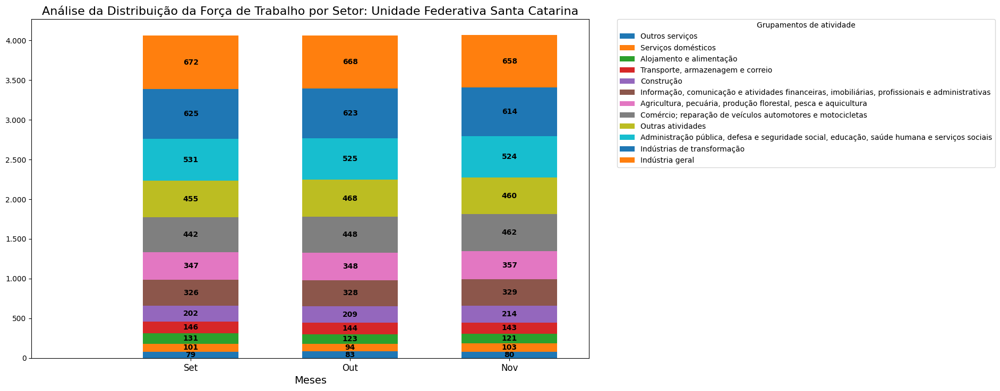

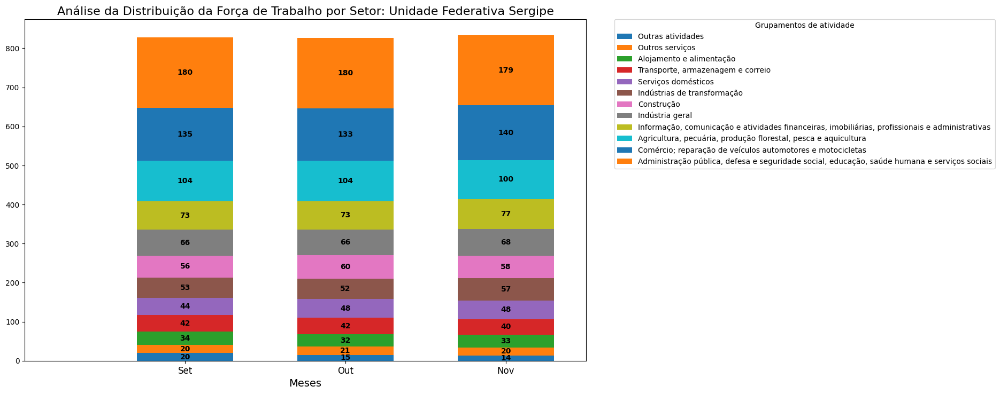

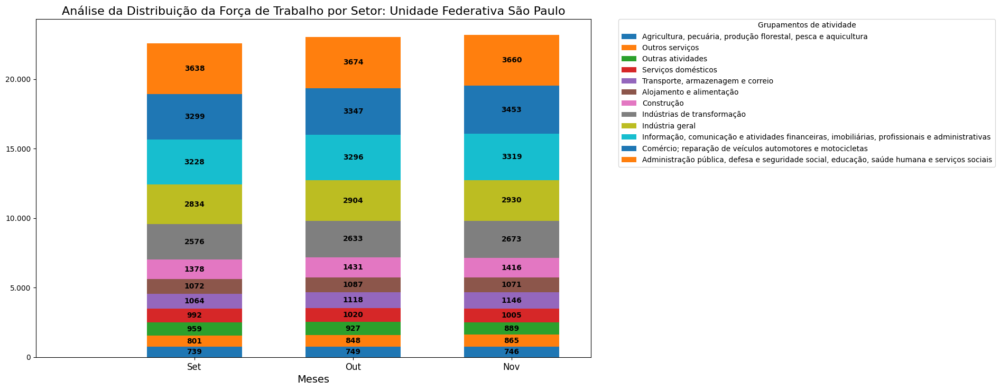

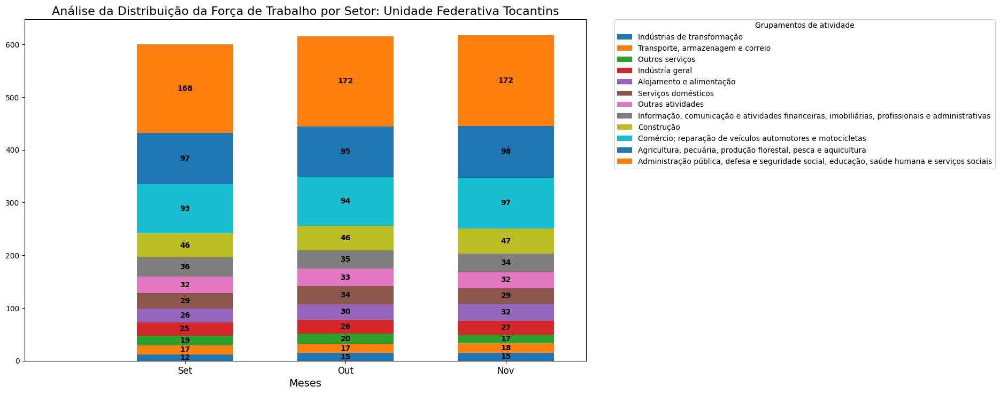

In [ ]:
# Análise de dados utilizando somente o índice 'Pessoas ocupadas (mil pessoas)'
# Loop para criar os gráficos para todos os UF
# for UF1 in df['UF'].unique():
# Dados para o DataFrame
df = df_original[(df_original['Ind'] == 'Pessoas ocupadas (mil pessoas)') & (df_original['Var1'] == 'Grupamentos de atividade')]

# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
df = df[df['Cat1'] != 'Total']

# Iterar sobre cada valor único de 'UF'
for cat1 in df['UF'].unique():
  # Filtrar o DataFrame para a categoria atual
  subset_cat1 = df[df['UF'] == cat1]

  # Criar o gráfico
  fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

  # Inicializar os valores de "bottom" para empilhar as barras
  bottom_values = np.zeros(len(months))

  # Plotar barras empilhadas para cada categoria de 'Ind'
  for ind in subset_cat1['Cat1'].unique():
      subset_ind = subset_cat1[subset_cat1['Cat1'] == ind]
      values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
      bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

      # Adicionar rótulos de dados
      for bar in bars:
          ax.text(
              bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
              bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
              f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
              ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
          )

      # Atualizar os valores do "bottom" para a próxima categoria
      bottom_values += values

  # Adicionar título e rótulos
  ax.set_xlabel('Meses', fontsize=14)
  ax.set_ylabel('', fontsize=14)
  ax.set_title(f'Análise da Distribuição da Força de Trabalho por Setor: Unidade Federativa {cat1}', fontsize=16)
  ax.set_xticks(x)
  ax.set_xticklabels(months, fontsize=12)

  # Ajustar os limites do eixo X para deslocar as barras à esquerda
  ax.set_xlim(-1, len(months) - 0.5)

  # Posicionar a legenda na parte direita do gráfico
  ax.legend(title='Grupamentos de atividade', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

  # Configurar separador de milhar no eixo Y
  ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',','.')))

  # Ajustar margens do gráfico
  plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

  # Exibir o gráfico
  plt.show()


##Distribuição da Força de Trabalho segundo a Condição de Afastamento do Trabalho

In [ ]:
# Building a DataFrame of Busy/ Not busy - Ocupados/Desocupadosfrom DF
# Filter the DataFrame
df = df_original #Copy original DF data
Ocupados_Desocupados_df = df[(df['Nivel'] == 'Unidade da Federação')]

# Lista de valores para iteração
var1_values = [
              'Condição de afastamento',
              'Cor ou Raça',
              'Grupamentos de atividade',
              'Grupamentos ocupacionais',
              'Grupos de Idade',
              'Grupos de Idade 2',
              'Nível de instrução',
              'Posição na ocupação e categoria do emprego',
              'Rendimento real domiciliar per capita efetivamente recebido',
              'Sexo'
               ]

# Dicionário para armazenar os resultados
result_dfs = {}

# Loop para criar DataFrames filtrados
for var1 in var1_values:
    filtered_df = Ocupados_Desocupados_df[Ocupados_Desocupados_df['Var1'] == var1]
    result_dfs[var1] = filtered_df  # Salvar no dicionário

    # Dicionário para substituições - Para facilitar leitura da legenda
replace_dict = {
            'Pessoas ocupadas (mil pessoas)':'Pessoas ocupadas (mil pessoas)',
            'Pessoas ocupadas e não afastadas do trabalho, que trabalhavam de forma remota (mil pessoas)':'Trabalhadores remotos não afastados (mil pessoas)',
            'Pessoas ocupadas e afastadas do trabalho que tinham devido ao distanciamento social (mil pessoas)':'Afastados por distanciamento social (mil pessoas):',
            'Pessoas desocupadas (mil pessoas)':'Pessoas desocupadas (mil pessoas)',
            'Pessoas não ocupadas que não procuraram trabalho por conta da pandemia ou por falta de trabalho na localidade, mas que gostariam de trabalhar na semana anterior (mil pessoas)':'Disponíveis, mas não procuraram emprego (mil pessoas):',
            'Pessoas na força de trabalho (mil pessoas)':'Pessoas na força de trabalho (mil pessoas)', #Não será usado por falta de detalhamento da população
            'Pessoas que apresentaram sintomas referenciados conjugados3 (mil pessoas)':'Apresentaram sintomas referenciados conjugados3 (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus (mil pessoas)':'Fizeram teste para Coronavírus (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus e testaram positivo (mil pessoas) ':'Testaram positivo para Coronavírus (mil pessoas)',
            'Massa de rendimento médio real efetivamente recebido de todos os trabalhos das pessoas ocupadas com rendimento do trabalho (milhões de R$)':'Rendimento médio real total (milhões de R$)'
            }

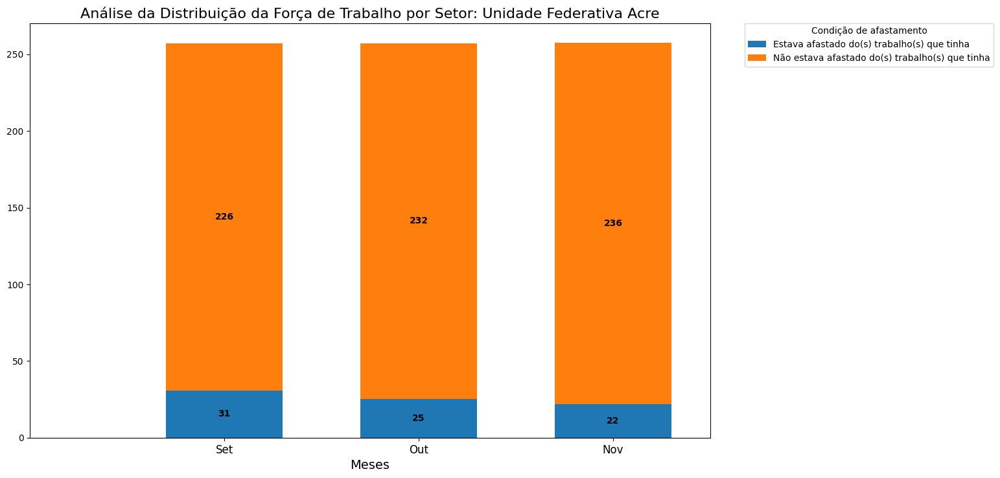

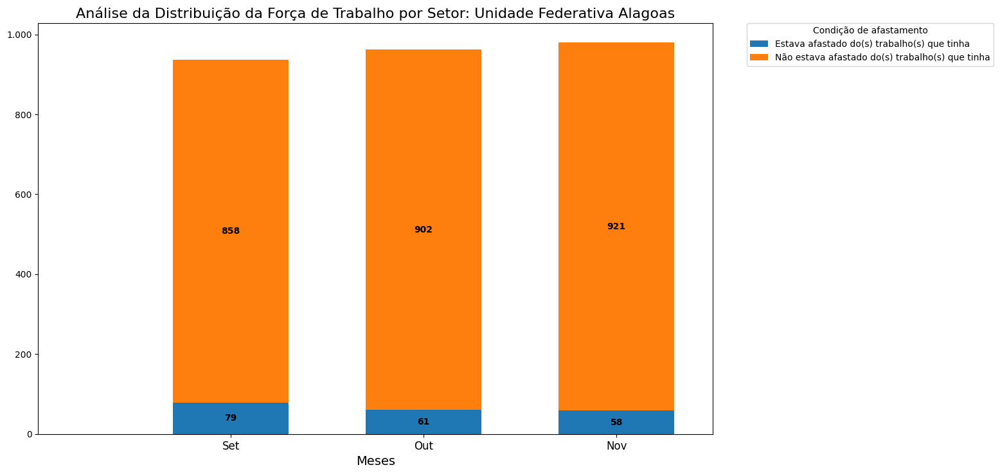

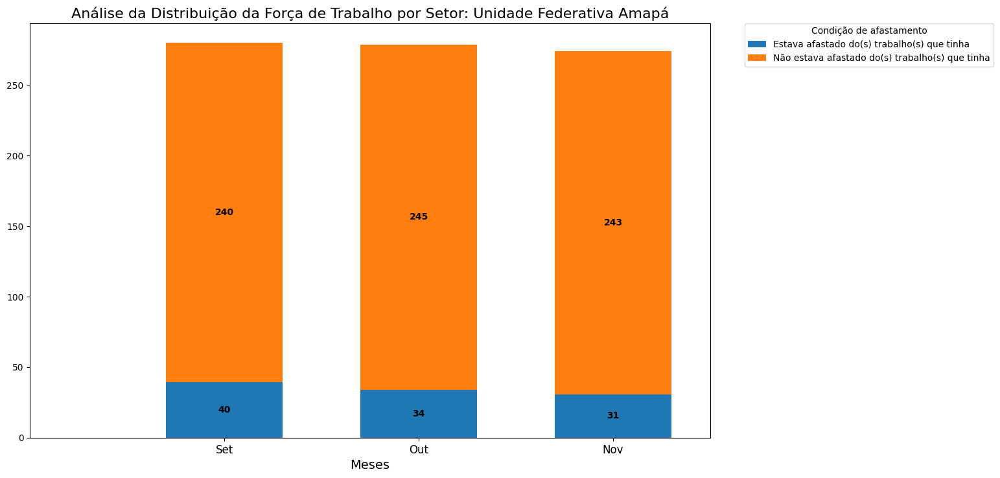

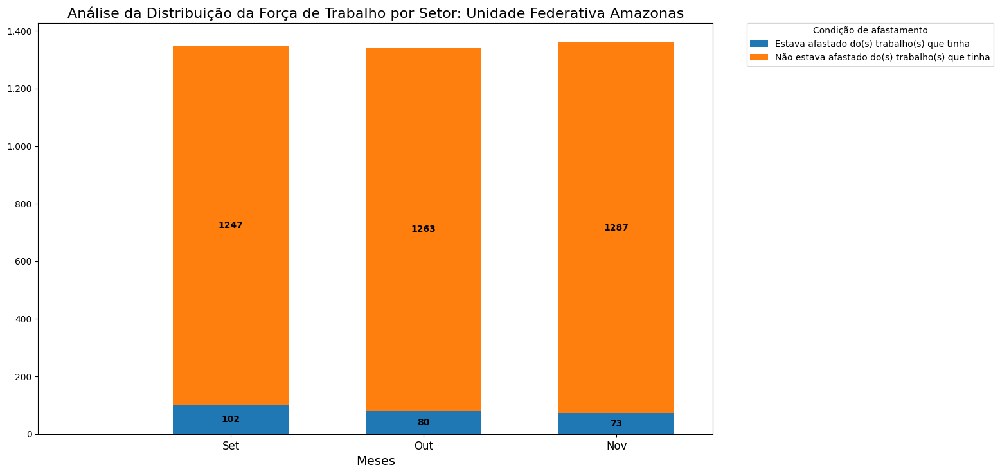

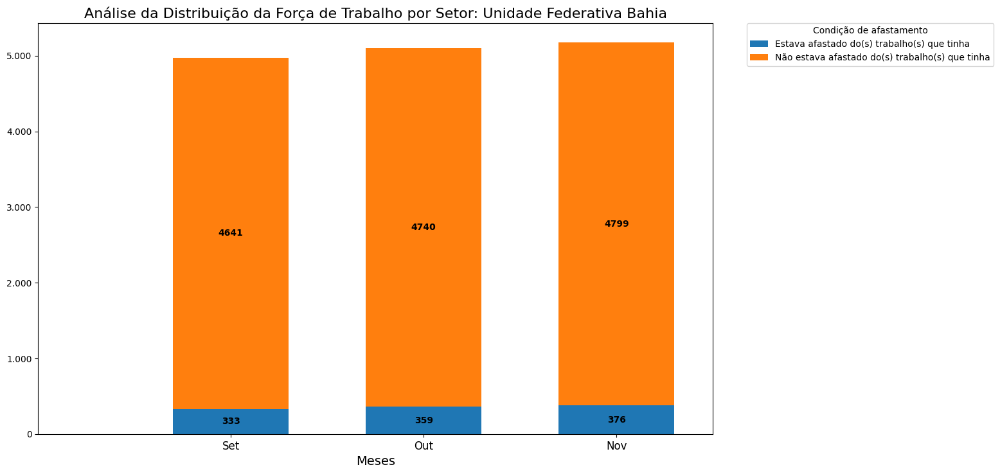

...

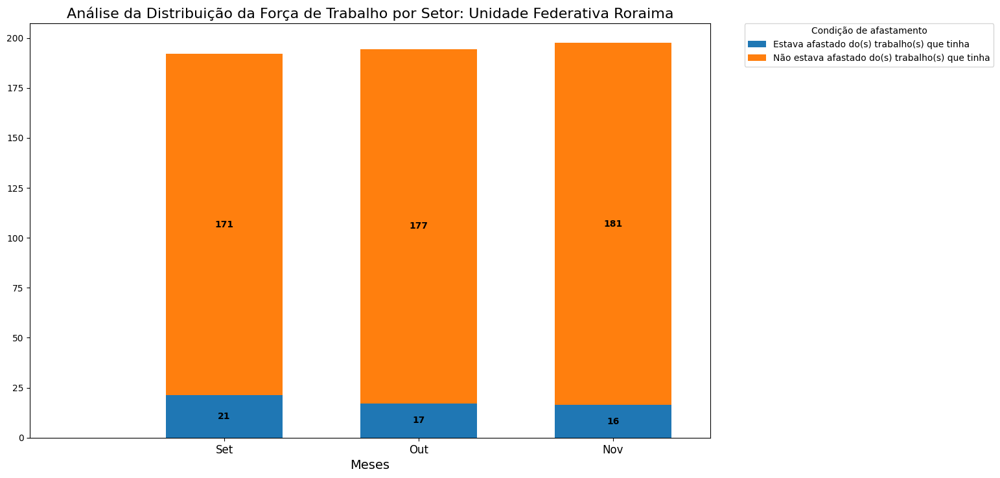

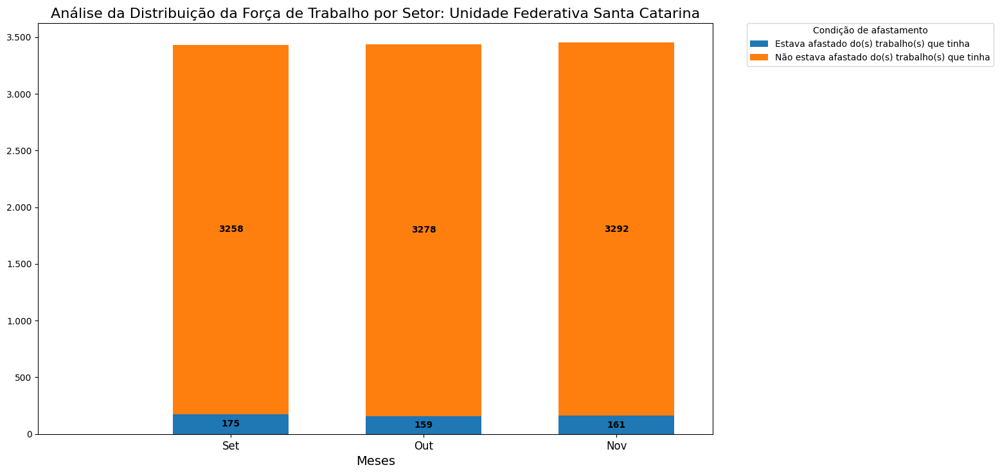

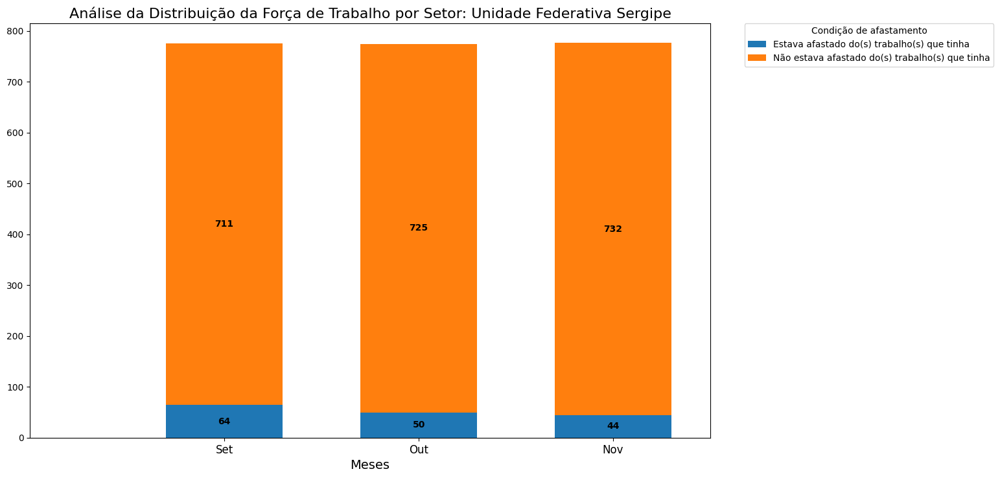

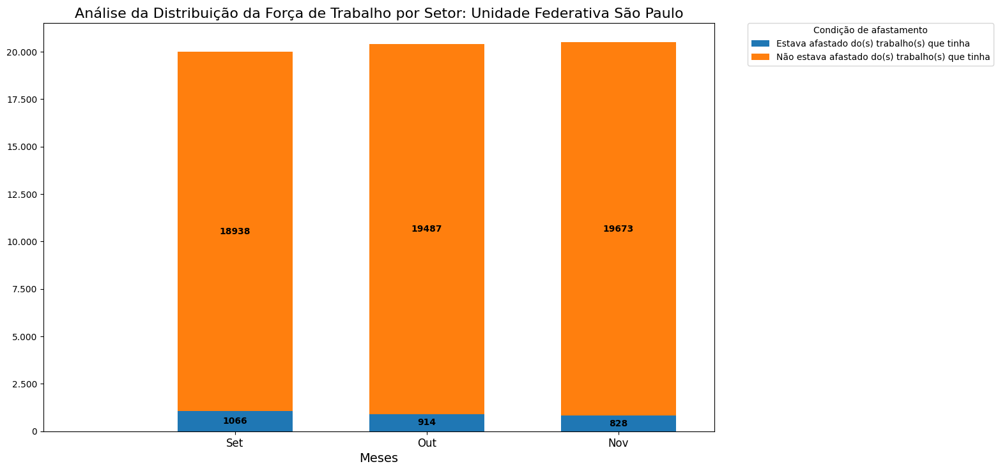

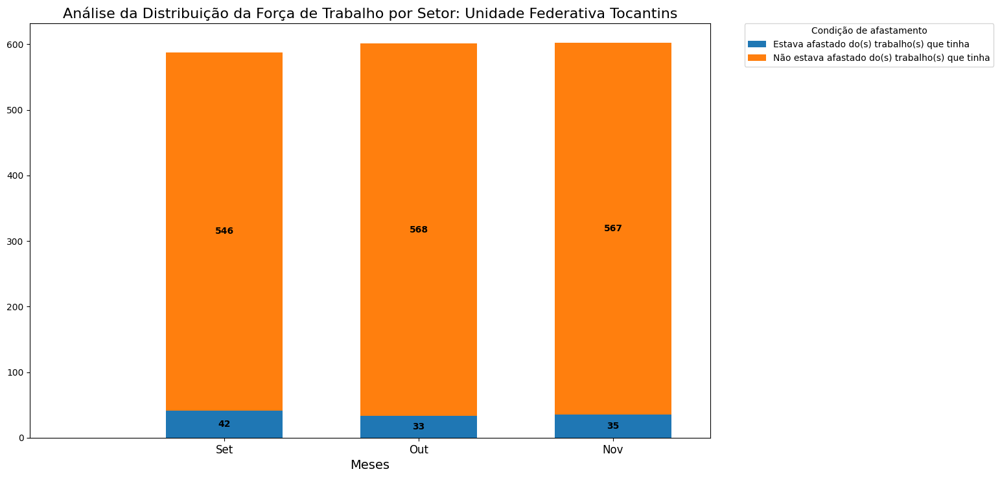

In [ ]:
# Análise de dados utilizando somente o índice 'Pessoas ocupadas (mil pessoas)'
# Loop para criar os gráficos para todos os UF
# for UF1 in df['UF'].unique():
# Dados para o DataFrame
df = df_original[(df_original['Ind'] == 'Pessoas ocupadas (mil pessoas)') & (df_original['Var1'] == 'Condição de afastamento')]

# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
df = df[df['Cat1'] != 'Total']

# Iterar sobre cada valor único de 'UF'
for cat1 in df['UF'].unique():
  # Filtrar o DataFrame para a categoria atual
  subset_cat1 = df[df['UF'] == cat1]

  # Criar o gráfico
  fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

  # Inicializar os valores de "bottom" para empilhar as barras
  bottom_values = np.zeros(len(months))

  # Plotar barras empilhadas para cada categoria de 'Ind'
  for ind in subset_cat1['Cat1'].unique():
      subset_ind = subset_cat1[subset_cat1['Cat1'] == ind]
      values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
      bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

      # Adicionar rótulos de dados
      for bar in bars:
          ax.text(
              bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
              bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
              f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
              ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
          )

      # Atualizar os valores do "bottom" para a próxima categoria
      bottom_values += values

  # Adicionar título e rótulos
  ax.set_xlabel('Meses', fontsize=14)
  ax.set_ylabel('', fontsize=14)
  ax.set_title(f'Análise da Distribuição da Força de Trabalho por Setor: Unidade Federativa {cat1}', fontsize=16)
  ax.set_xticks(x)
  ax.set_xticklabels(months, fontsize=12)

  # Ajustar os limites do eixo X para deslocar as barras à esquerda
  ax.set_xlim(-1, len(months) - 0.5)

  # Posicionar a legenda na parte direita do gráfico
  ax.legend(title='Condição de afastamento', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

  # Configurar separador de milhar no eixo Y
  ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',','.')))

  # Ajustar margens do gráfico
  plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

  # Exibir o gráfico
  plt.show()


##Perfil da População Testada para COVID-19 por Unidade Federativa:

In [ ]:
# Building a DataFrame of Busy/ Not busy - Ocupados/Desocupadosfrom DF
# Filter the DataFrame
df = df_original #Copy original DF data
Ocupados_Desocupados_df = df[(df['Nivel'] == 'Unidade da Federação')]

# Lista de valores para iteração
var1_values = [
              'Condição de afastamento',
              'Cor ou Raça',
              'Grupamentos de atividade',
              'Grupamentos ocupacionais',
              'Grupos de Idade',
              'Grupos de Idade 2',
              'Nível de instrução',
              'Posição na ocupação e categoria do emprego',
              'Rendimento real domiciliar per capita efetivamente recebido',
              'Sexo'
               ]

# Dicionário para armazenar os resultados
result_dfs = {}

# Loop para criar DataFrames filtrados
for var1 in var1_values:
    filtered_df = Ocupados_Desocupados_df[Ocupados_Desocupados_df['Var1'] == var1]
    result_dfs[var1] = filtered_df  # Salvar no dicionário

    # Dicionário para substituições - Para facilitar leitura da legenda
replace_dict = {
            'Pessoas ocupadas (mil pessoas)':'Pessoas ocupadas (mil pessoas)',
            'Pessoas ocupadas e não afastadas do trabalho, que trabalhavam de forma remota (mil pessoas)':'Trabalhadores remotos não afastados (mil pessoas)',
            'Pessoas ocupadas e afastadas do trabalho que tinham devido ao distanciamento social (mil pessoas)':'Afastados por distanciamento social (mil pessoas):',
            'Pessoas desocupadas (mil pessoas)':'Pessoas desocupadas (mil pessoas)',
            'Pessoas não ocupadas que não procuraram trabalho por conta da pandemia ou por falta de trabalho na localidade, mas que gostariam de trabalhar na semana anterior (mil pessoas)':'Disponíveis, mas não procuraram emprego (mil pessoas):',
            'Pessoas na força de trabalho (mil pessoas)':'Pessoas na força de trabalho (mil pessoas)', #Não será usado por falta de detalhamento da população
            'Pessoas que apresentaram sintomas referenciados conjugados3 (mil pessoas)':'Apresentaram sintomas referenciados conjugados3 (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus (mil pessoas)':'Fizeram teste para Coronavírus (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus e testaram positivo (mil pessoas) ':'Testaram positivo para Coronavírus (mil pessoas)',
            'Massa de rendimento médio real efetivamente recebido de todos os trabalhos das pessoas ocupadas com rendimento do trabalho (milhões de R$)':'Rendimento médio real total (milhões de R$)'
            }

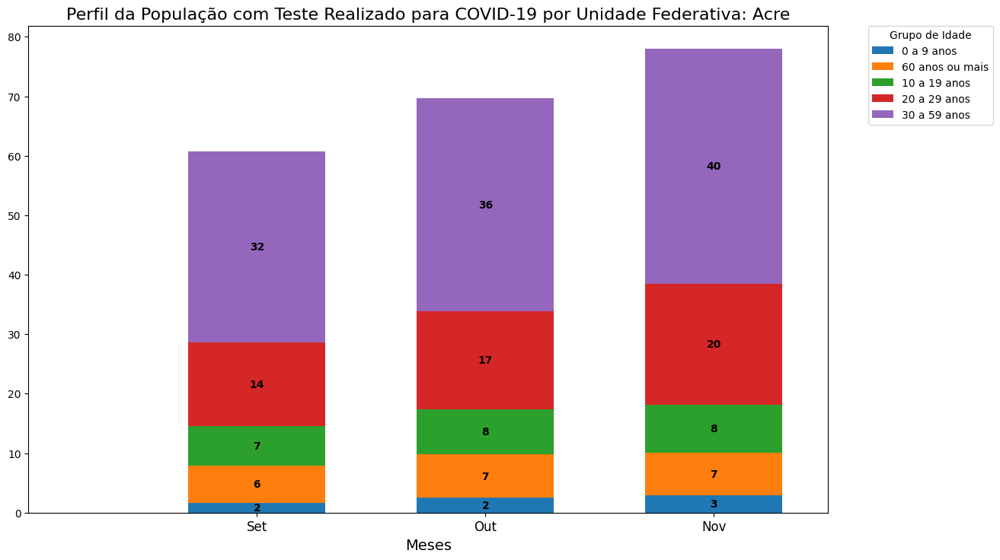

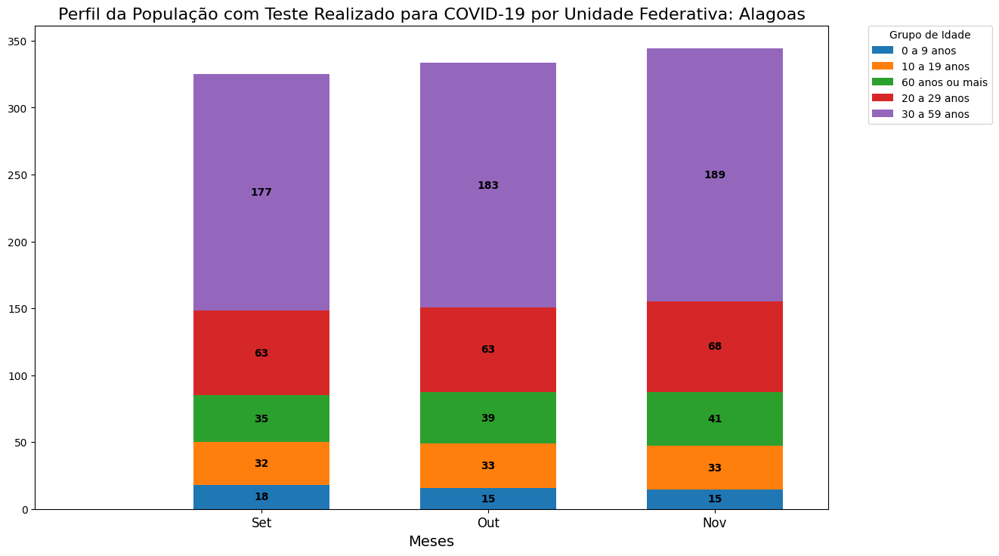

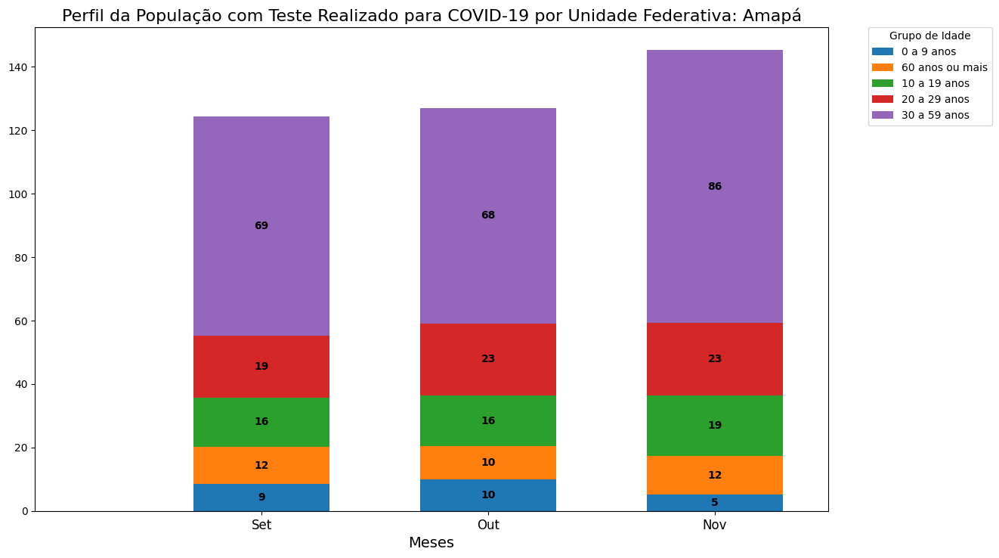

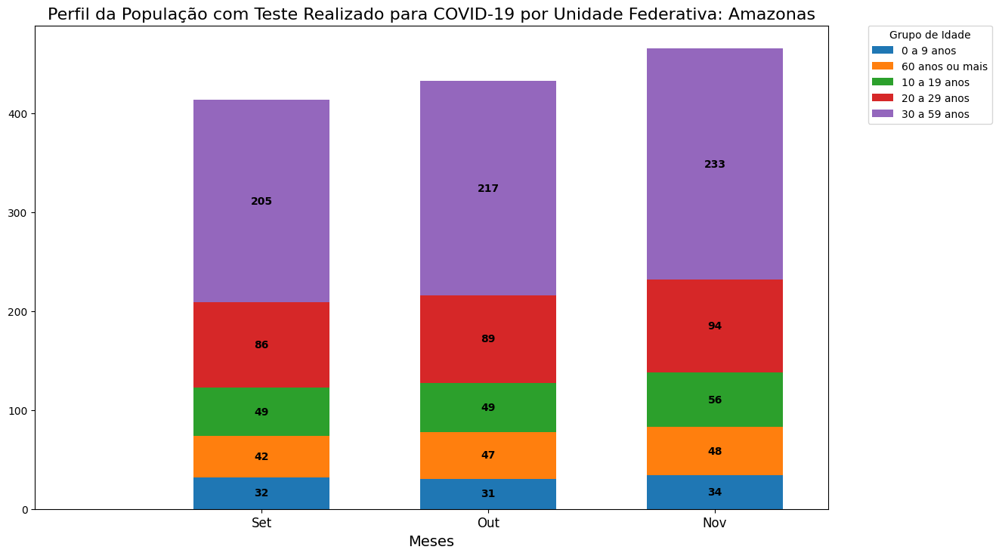

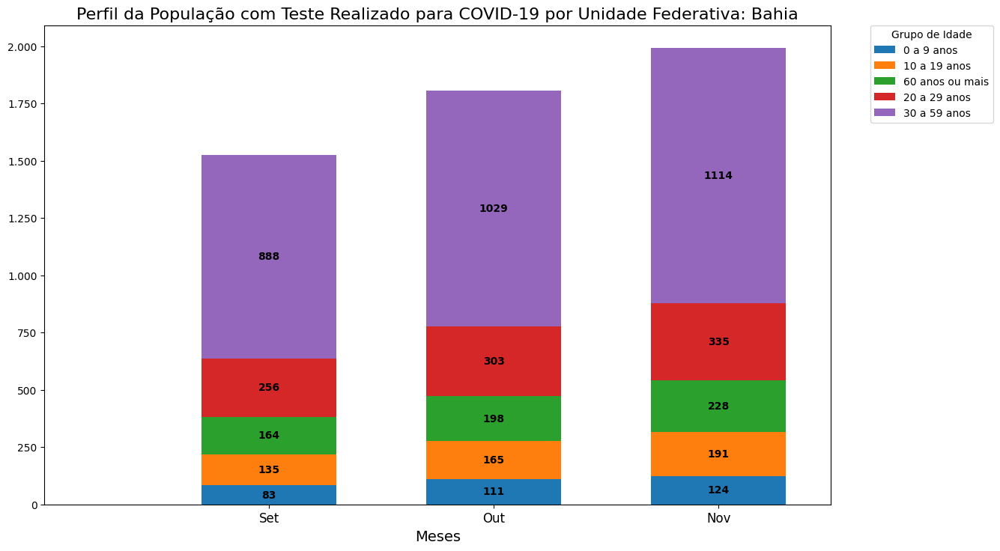

...

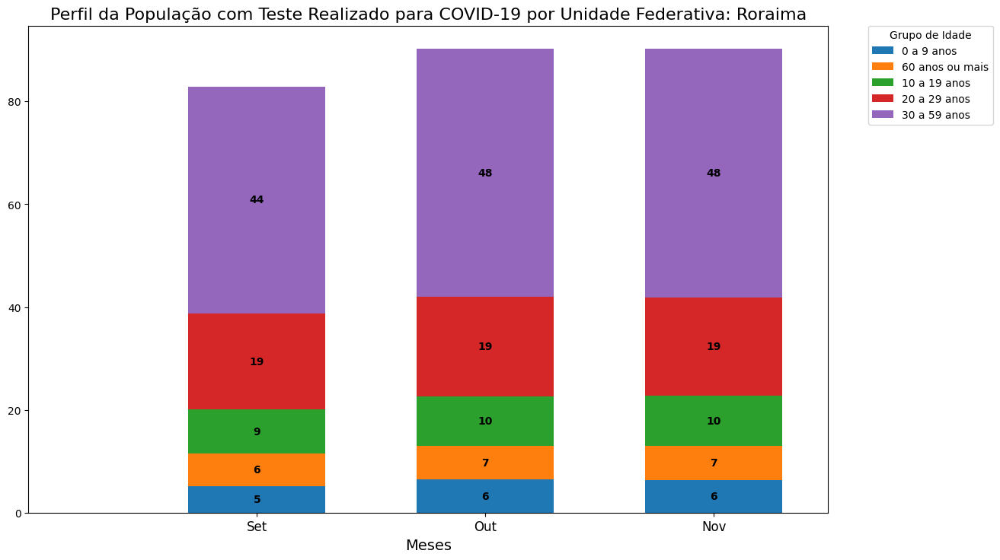

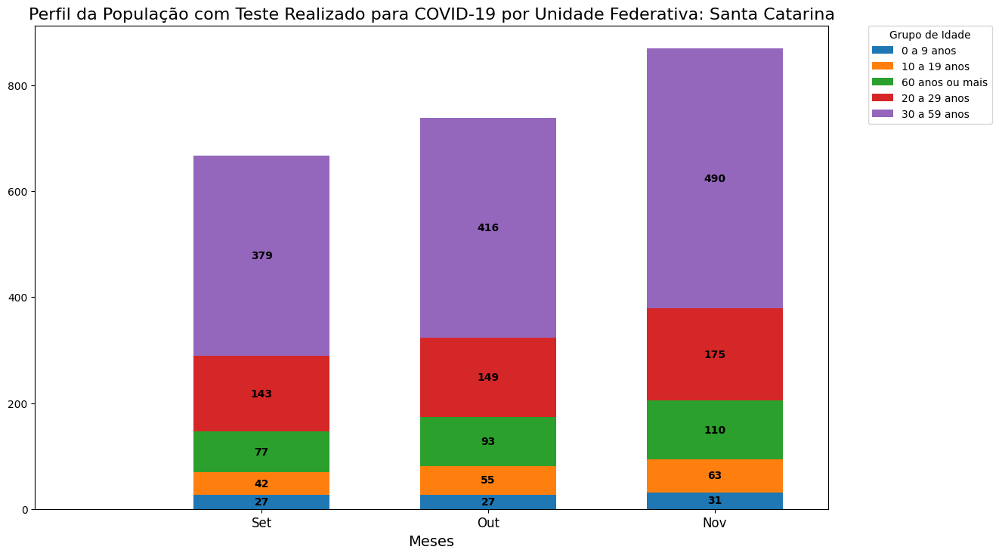

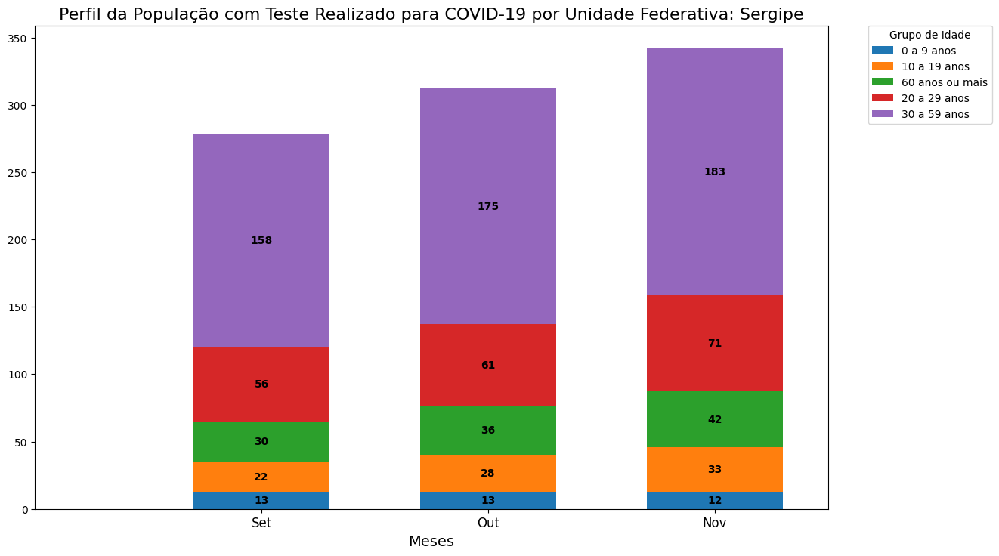

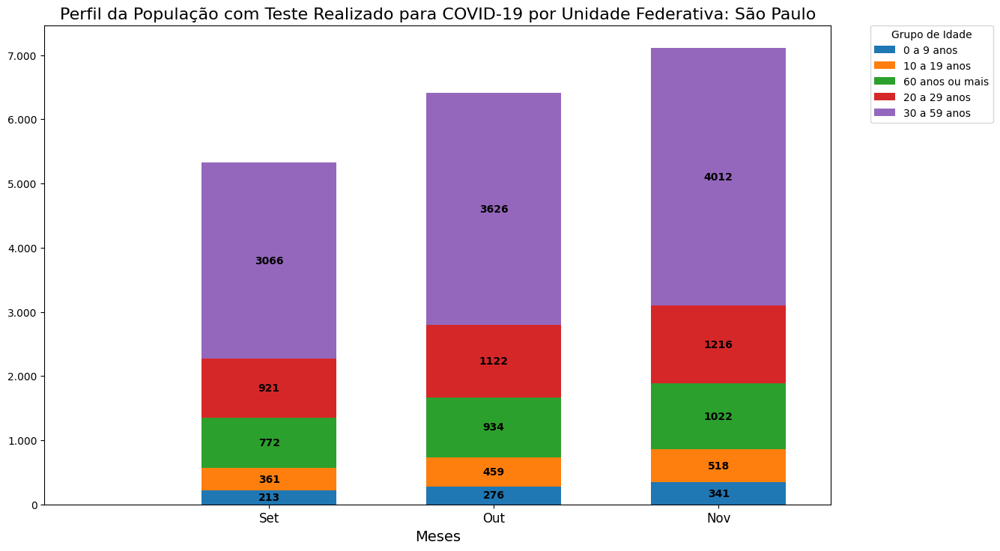

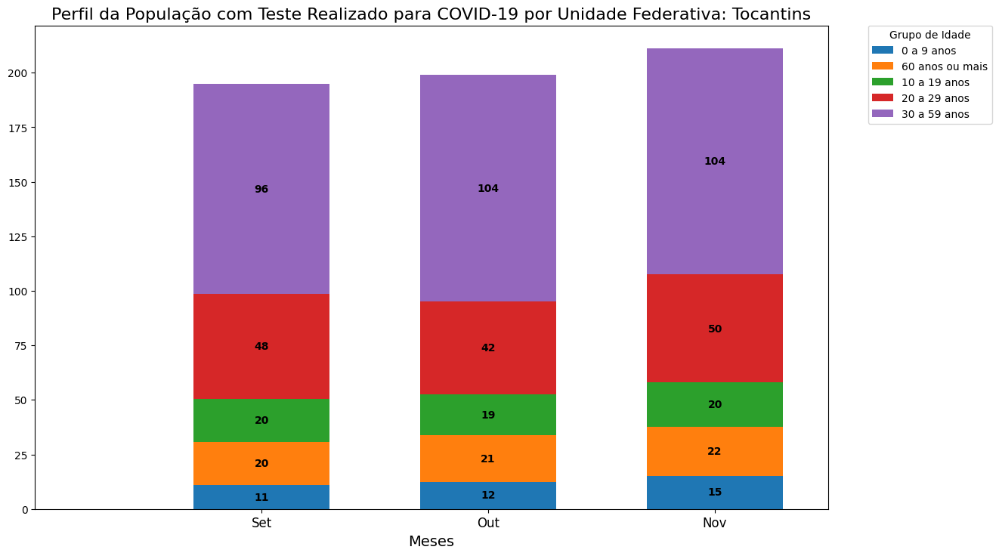

In [ ]:
# Análise de dados utilizando somente o índice 'Pessoas ocupadas (mil pessoas)'
# Loop para criar os gráficos para todos os UF
# for UF1 in df['UF'].unique():
# Dados para o DataFrame
df = df_original[(df_original['Ind'] == 'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus (mil pessoas)') & (df_original['Var1'] == 'Grupos de Idade')]

# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
df = df[df['Cat1'] != 'Total']

# Iterar sobre cada valor único de 'UF'
for cat1 in df['UF'].unique():
  # Filtrar o DataFrame para a categoria atual
  subset_cat1 = df[df['UF'] == cat1]

  # Criar o gráfico
  fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

  # Inicializar os valores de "bottom" para empilhar as barras
  bottom_values = np.zeros(len(months))

  # Plotar barras empilhadas para cada categoria de 'Category'
  for ind in subset_cat1['Cat1'].unique():
      subset_ind = subset_cat1[subset_cat1['Cat1'] == ind]
      values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
      bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

      # Adicionar rótulos de dados
      for bar in bars:
          ax.text(
              bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
              bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
              f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
              ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
          )

      # Atualizar os valores do "bottom" para a próxima categoria
      bottom_values += values

  # Adicionar título e rótulos
  ax.set_xlabel('Meses', fontsize=14)
  ax.set_ylabel('', fontsize=14)
  ax.set_title(f'Perfil da População com Teste Realizado para COVID-19 por Unidade Federativa: {cat1}', fontsize=16)
  ax.set_xticks(x)
  ax.set_xticklabels(months, fontsize=12)

  # Ajustar os limites do eixo X para deslocar as barras à esquerda
  ax.set_xlim(-1, len(months) - 0.5)

  # Posicionar a legenda na parte direita do gráfico
  ax.legend(title='Grupo de Idade', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

  # Configurar separador de milhar no eixo Y
  ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',','.')))

  # Ajustar margens do gráfico
  plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

  # Exibir o gráfico
  plt.show()


##Perfil da População com Teste Positivo para COVID-19 por Unidade Federativa

In [ ]:
# Building a DataFrame of Busy/ Not busy - Ocupados/Desocupadosfrom DF
# Filter the DataFrame
df = df_original #Copy original DF data
Ocupados_Desocupados_df = df[(df['Nivel'] == 'Unidade da Federação')]

# Lista de valores para iteração
var1_values = [
              'Condição de afastamento',
              'Cor ou Raça',
              'Grupamentos de atividade',
              'Grupamentos ocupacionais',
              'Grupos de Idade',
              'Grupos de Idade 2',
              'Nível de instrução',
              'Posição na ocupação e categoria do emprego',
              'Rendimento real domiciliar per capita efetivamente recebido',
              'Sexo'
               ]

# Dicionário para armazenar os resultados
result_dfs = {}

# Loop para criar DataFrames filtrados
for var1 in var1_values:
    filtered_df = Ocupados_Desocupados_df[Ocupados_Desocupados_df['Var1'] == var1]
    result_dfs[var1] = filtered_df  # Salvar no dicionário

    # Dicionário para substituições - Para facilitar leitura da legenda
replace_dict = {
            'Pessoas ocupadas (mil pessoas)':'Pessoas ocupadas (mil pessoas)',
            'Pessoas ocupadas e não afastadas do trabalho, que trabalhavam de forma remota (mil pessoas)':'Trabalhadores remotos não afastados (mil pessoas)',
            'Pessoas ocupadas e afastadas do trabalho que tinham devido ao distanciamento social (mil pessoas)':'Afastados por distanciamento social (mil pessoas):',
            'Pessoas desocupadas (mil pessoas)':'Pessoas desocupadas (mil pessoas)',
            'Pessoas não ocupadas que não procuraram trabalho por conta da pandemia ou por falta de trabalho na localidade, mas que gostariam de trabalhar na semana anterior (mil pessoas)':'Disponíveis, mas não procuraram emprego (mil pessoas):',
            'Pessoas na força de trabalho (mil pessoas)':'Pessoas na força de trabalho (mil pessoas)', #Não será usado por falta de detalhamento da população
            'Pessoas que apresentaram sintomas referenciados conjugados3 (mil pessoas)':'Apresentaram sintomas referenciados conjugados3 (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus (mil pessoas)':'Fizeram teste para Coronavírus (mil pessoas)',
            'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus e testaram positivo (mil pessoas) ':'Testaram positivo para Coronavírus (mil pessoas)',
            'Massa de rendimento médio real efetivamente recebido de todos os trabalhos das pessoas ocupadas com rendimento do trabalho (milhões de R$)':'Rendimento médio real total (milhões de R$)'
            }

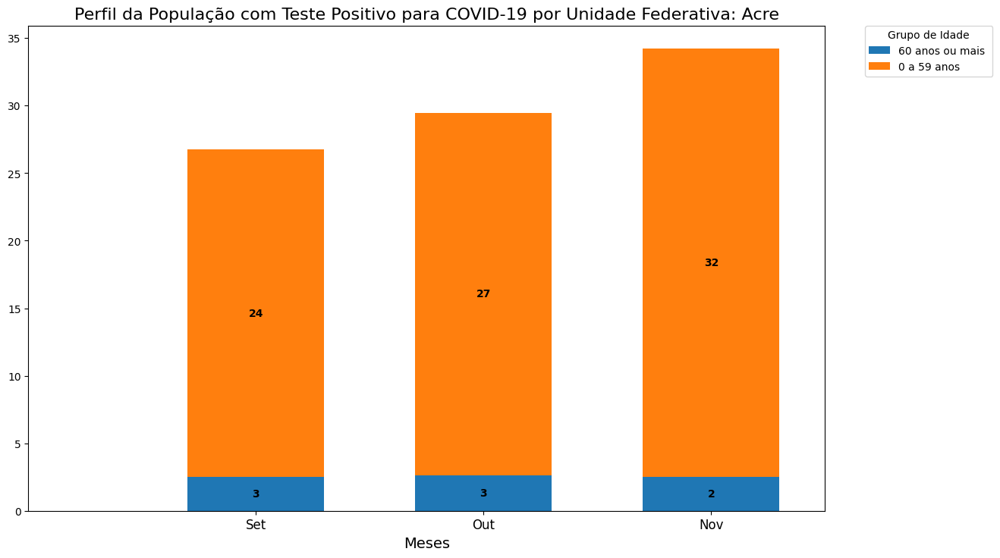

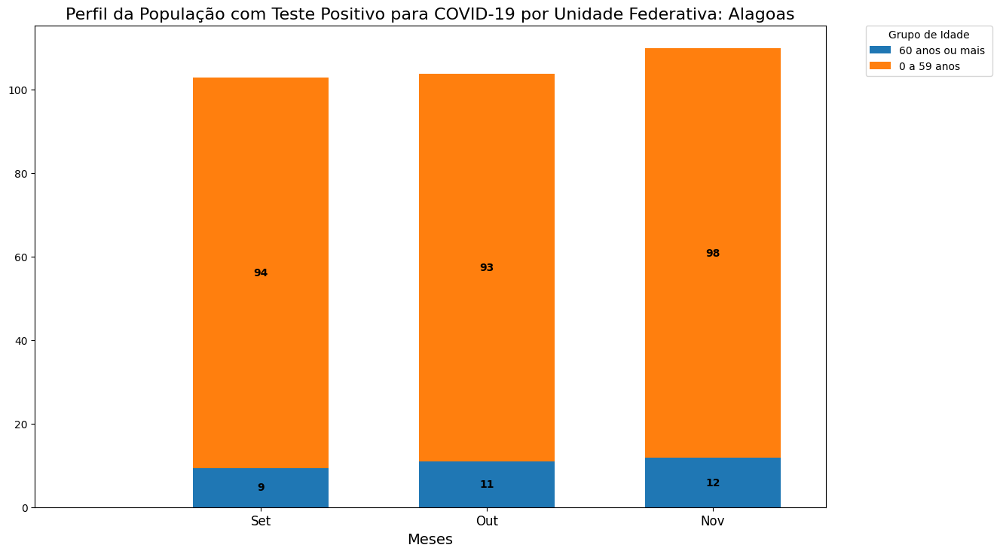

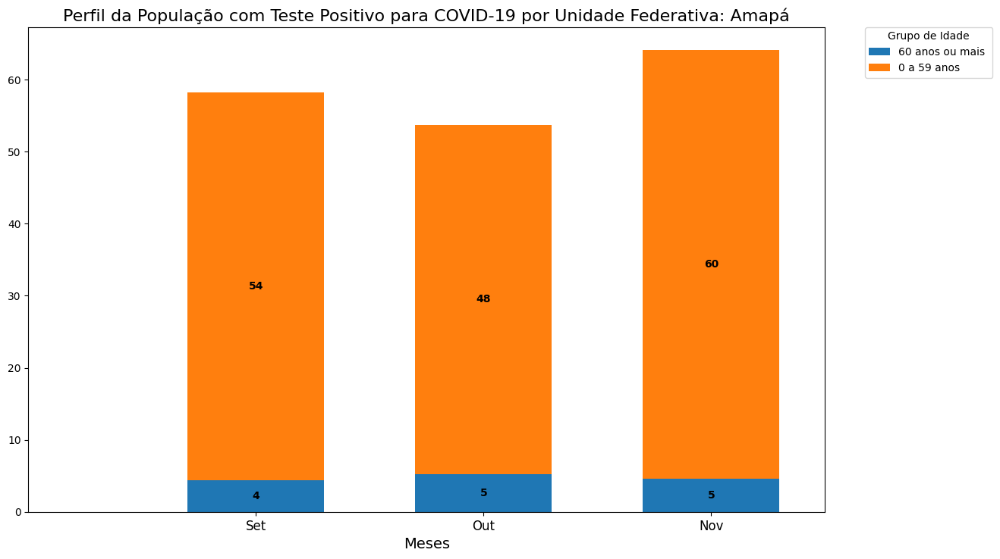

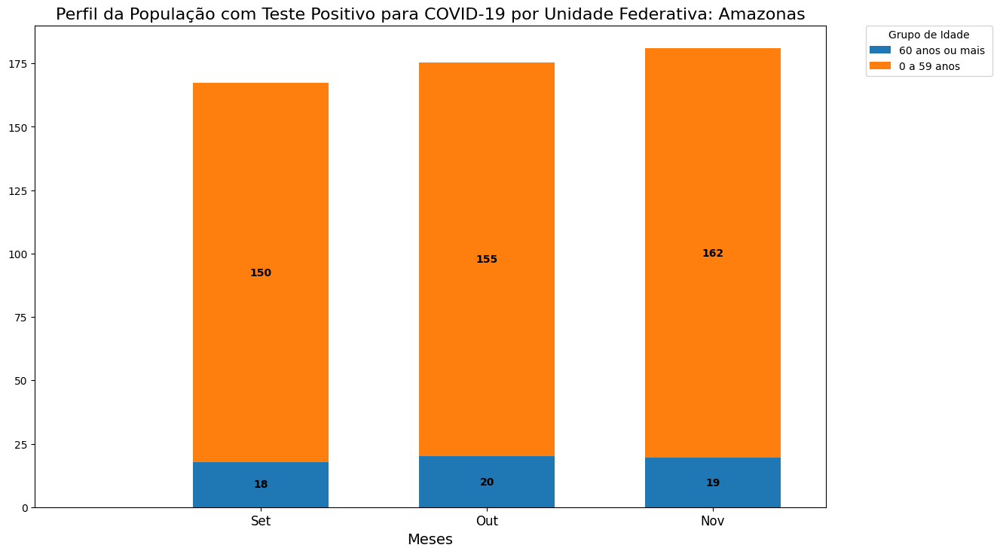

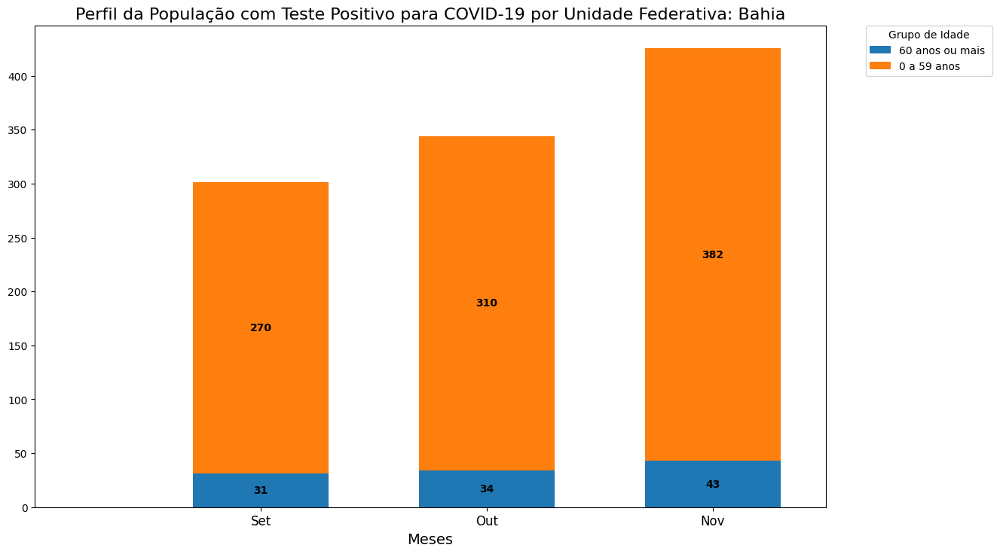

...

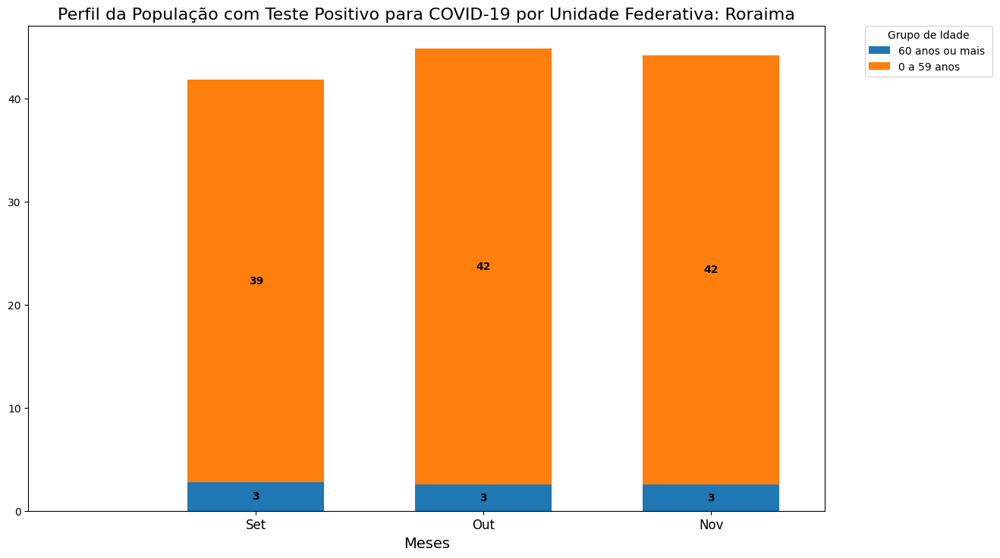

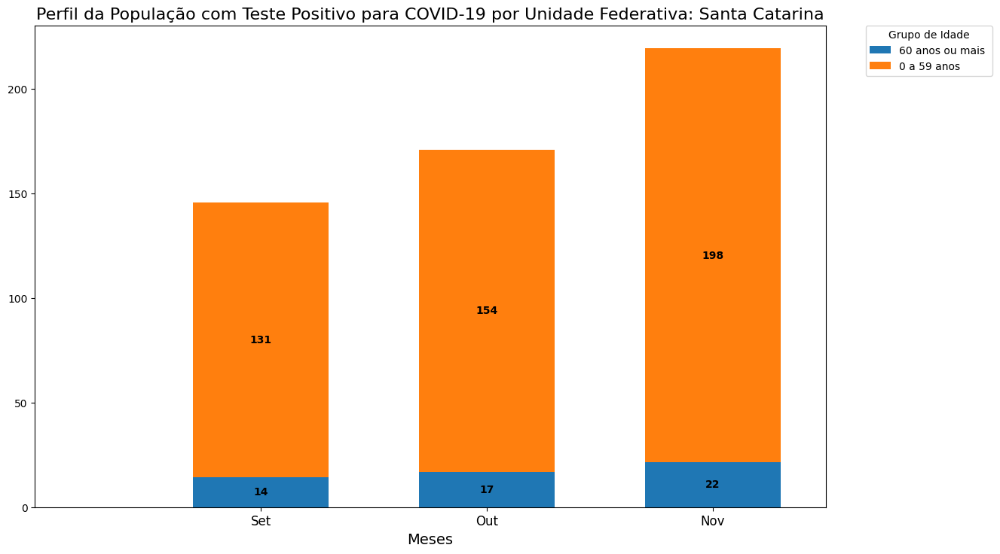

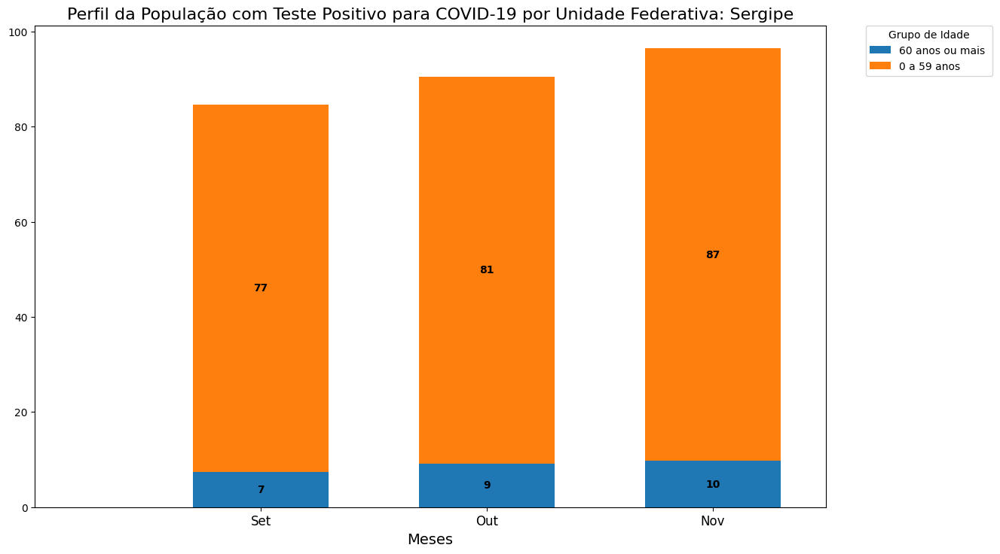

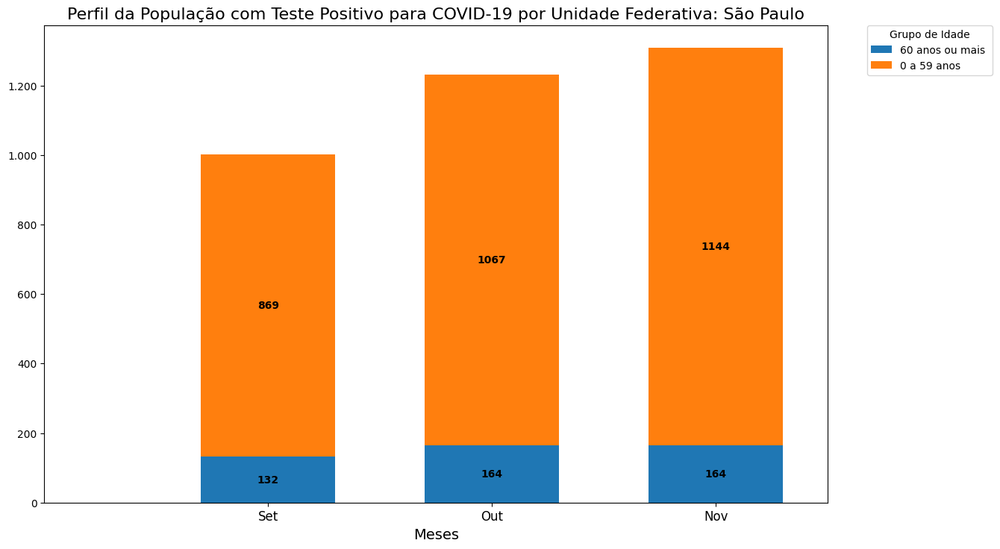

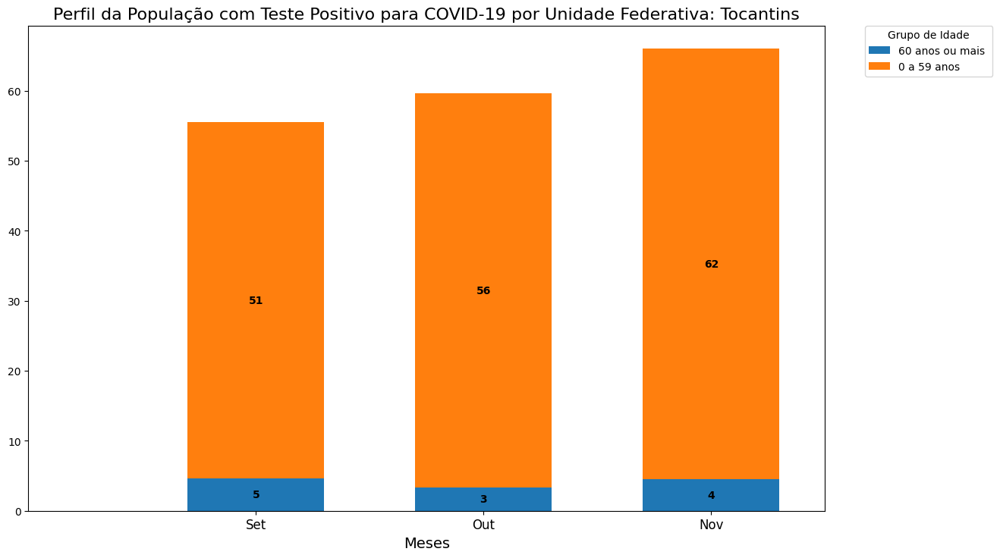

In [ ]:
# Análise de dados utilizando somente o índice 'Pessoas ocupadas (mil pessoas)'
# Loop para criar os gráficos para todos os UF
# for UF1 in df['UF'].unique():
# Dados para o DataFrame
df = df_original[(df_original['Ind'] == 'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus e testaram positivo (mil pessoas) ') & (df_original['Var1'] == 'Grupos de Idade 2')]

# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
df = df[df['Cat1'] != 'Total']
df = df[df['Cat1'] != 'Total ']

# Iterar sobre cada valor único de 'UF'
for cat1 in df['UF'].unique():
  # Filtrar o DataFrame para a categoria atual
  subset_cat1 = df[df['UF'] == cat1]

  # Criar o gráfico
  fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

  # Inicializar os valores de "bottom" para empilhar as barras
  bottom_values = np.zeros(len(months))

  # Plotar barras empilhadas para cada categoria de 'Category'
  for ind in subset_cat1['Cat1'].unique():
      subset_ind = subset_cat1[subset_cat1['Cat1'] == ind]
      values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
      bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

      # Adicionar rótulos de dados
      for bar in bars:
          ax.text(
              bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
              bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
              f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
              ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
          )

      # Atualizar os valores do "bottom" para a próxima categoria
      bottom_values += values

  # Adicionar título e rótulos
  ax.set_xlabel('Meses', fontsize=14)
  ax.set_ylabel('', fontsize=14)
  ax.set_title(f'Perfil da População com Teste Positivo para COVID-19 por Unidade Federativa: {cat1}', fontsize=16)
  ax.set_xticks(x)
  ax.set_xticklabels(months, fontsize=12)

  # Ajustar os limites do eixo X para deslocar as barras à esquerda
  ax.set_xlim(-1, len(months) - 0.5)

  # Posicionar a legenda na parte direita do gráfico
  ax.legend(title='Grupo de Idade', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

  # Configurar separador de milhar no eixo Y
  ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',','.')))

  # Ajustar margens do gráfico
  plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

  # Exibir o gráfico
  plt.show()


#Características econômicas da sociedade

##Rendimento domiciliar da População Testada para COVID-19 por Unidade Federativa



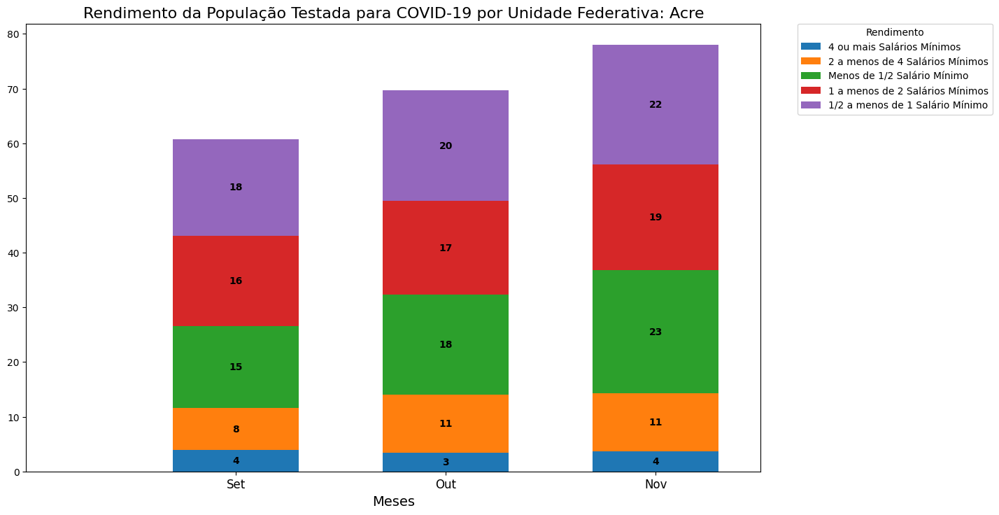

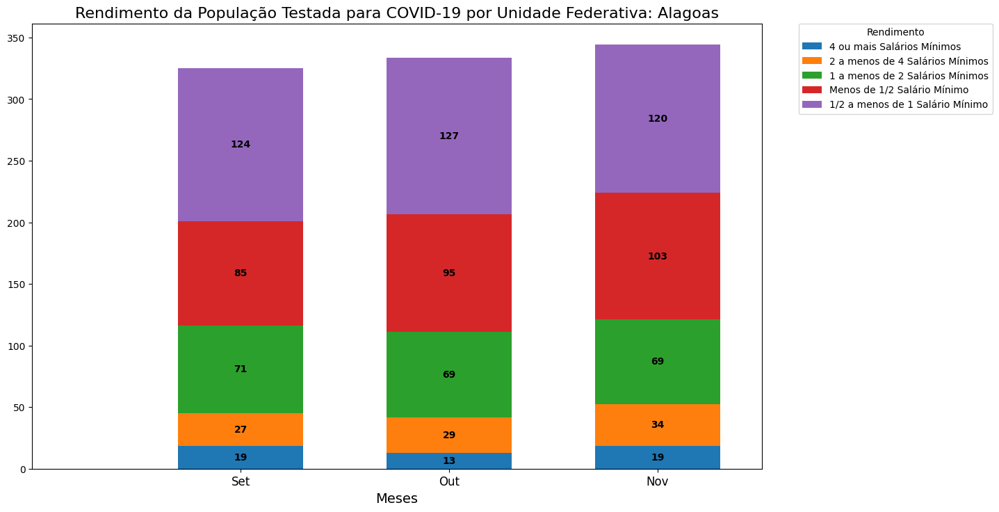

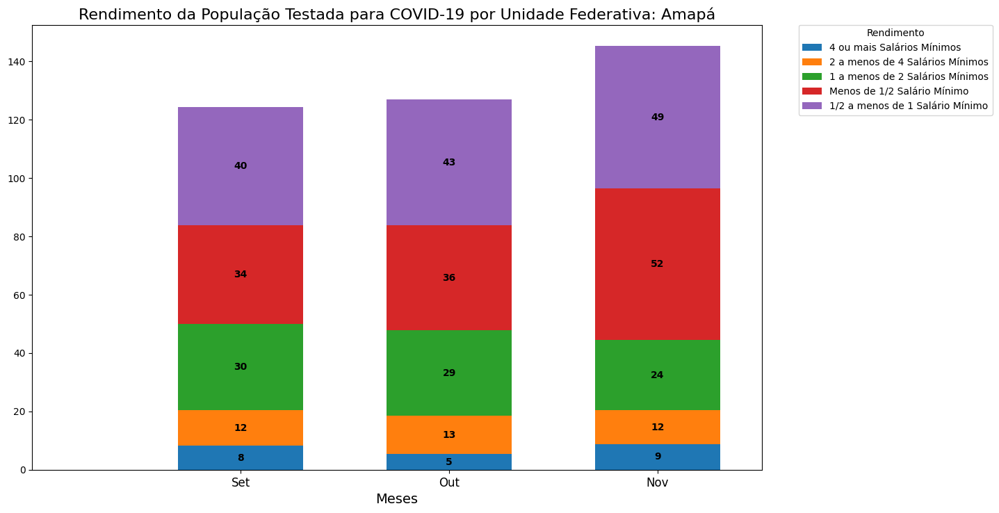

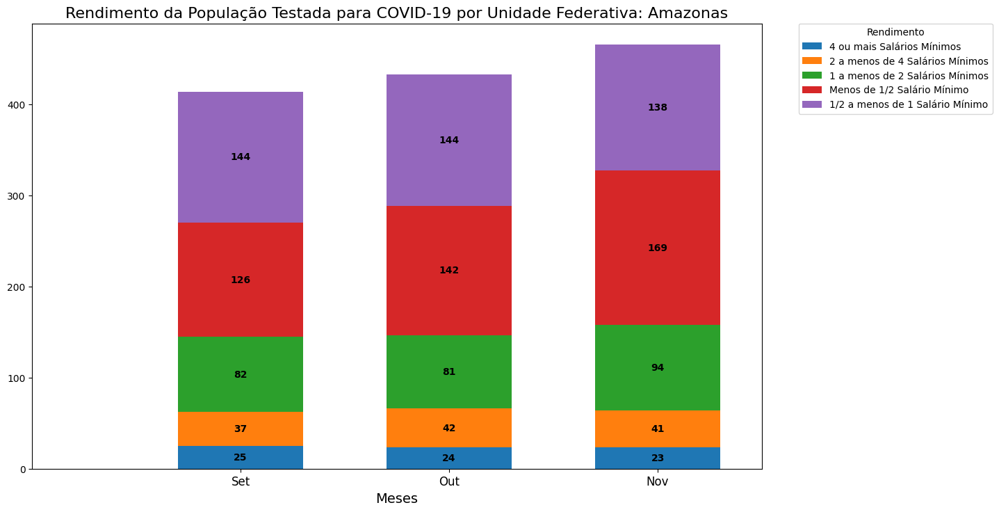

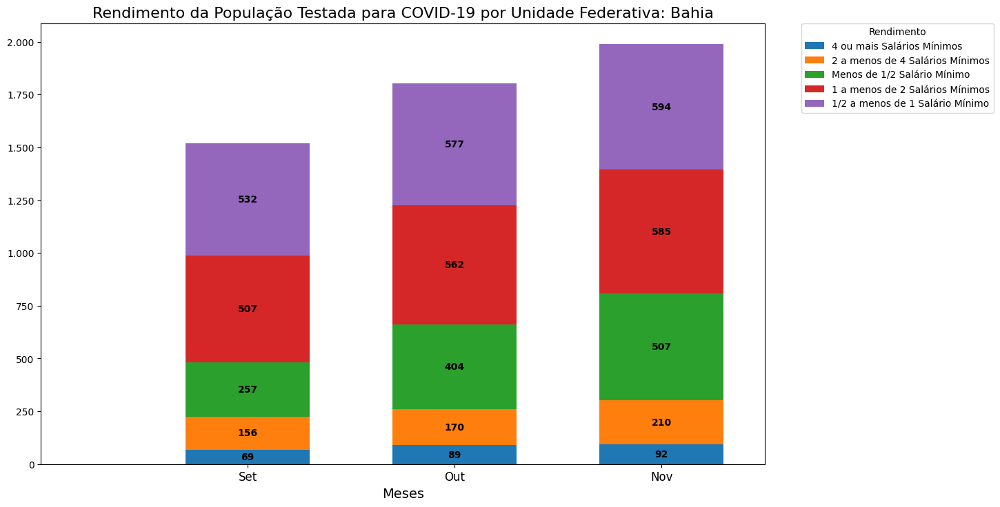

...

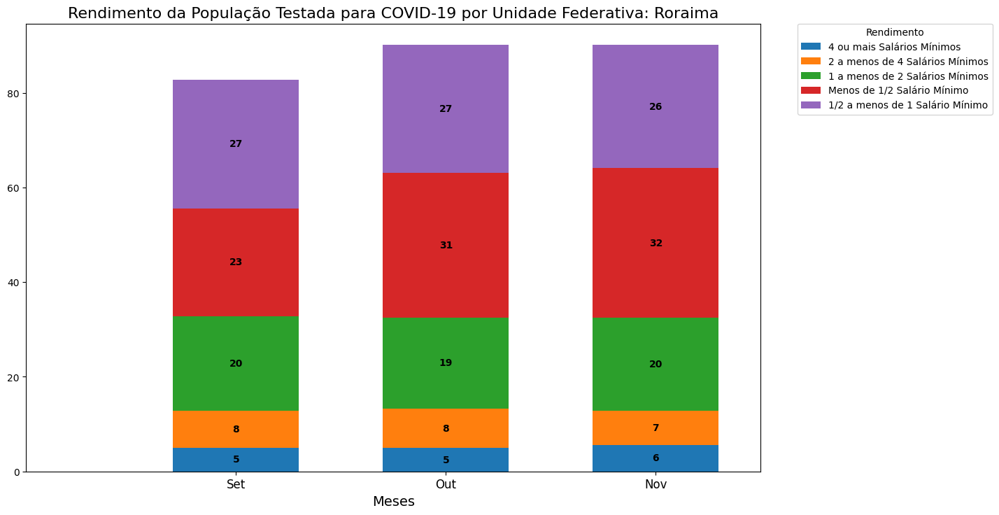

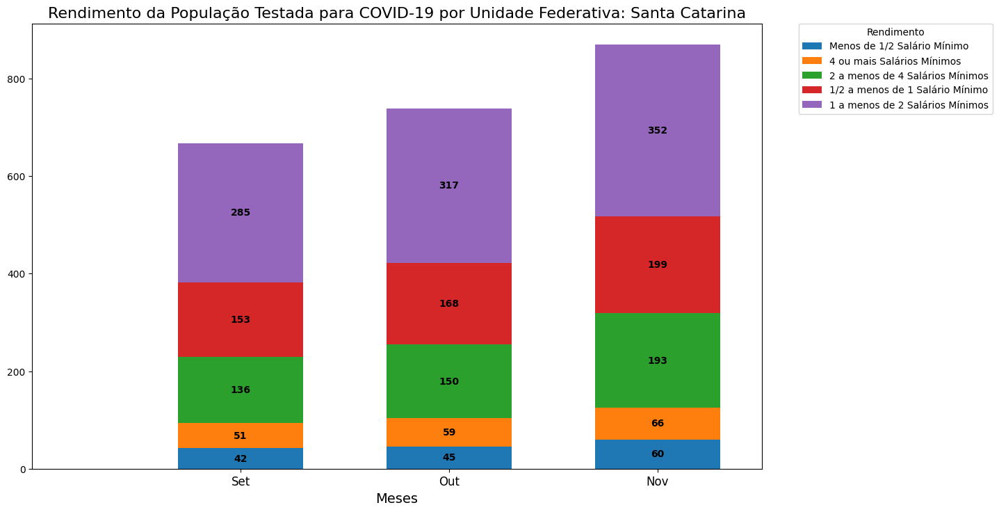

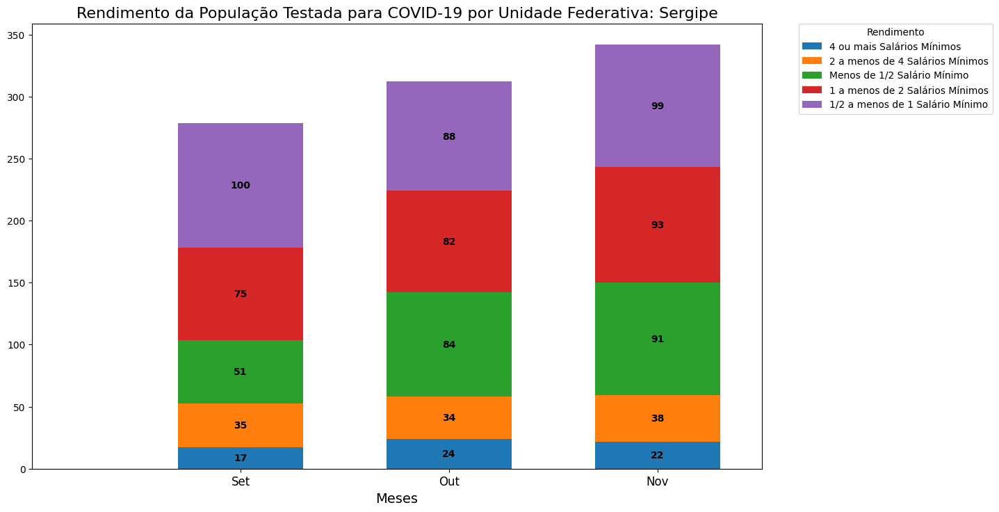

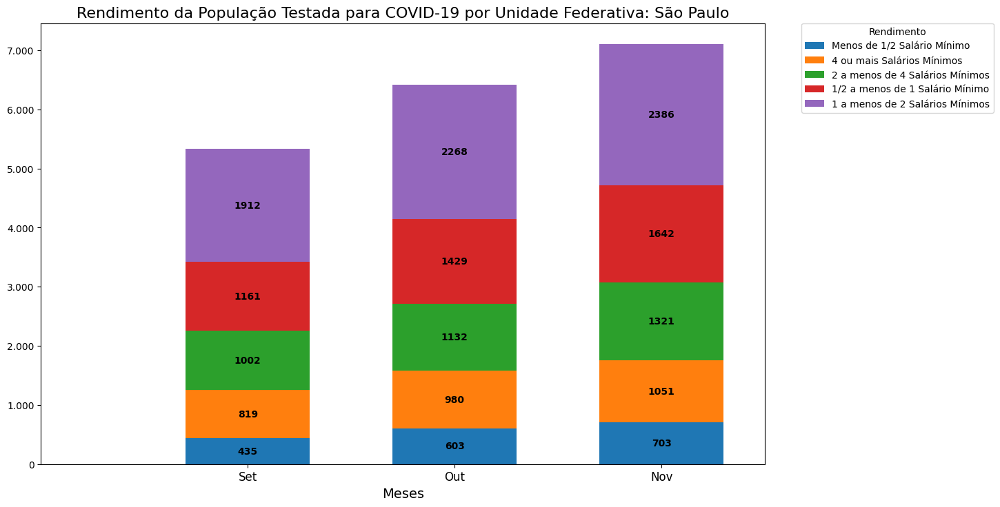

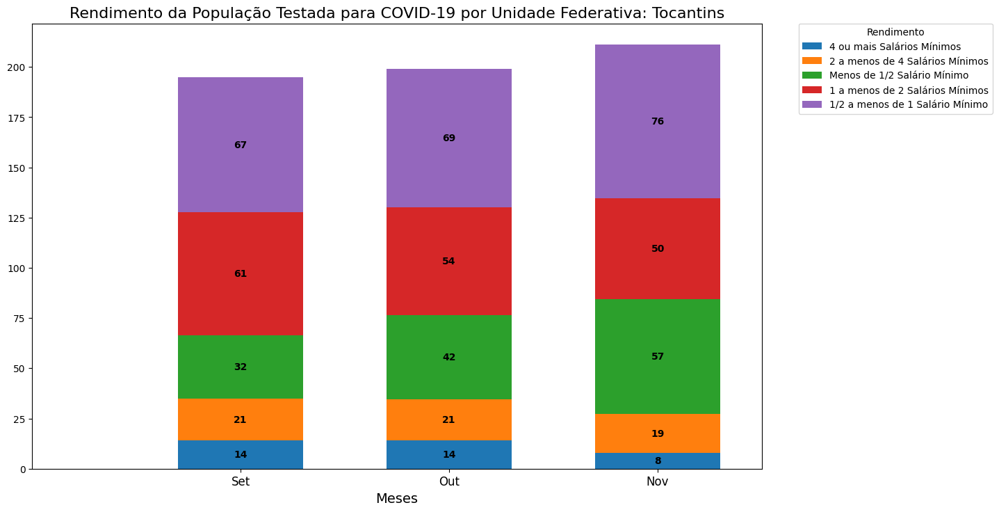

In [ ]:
# Análise de dados utilizando somente o índice 'Pessoas ocupadas (mil pessoas)'
# Loop para criar os gráficos para todos os UF
# for UF1 in df['UF'].unique():
# Dados para o DataFrame
df = df_original[(df_original['Ind'] == 'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus (mil pessoas)') & (df_original['Var1'] == 'Rendimento real domiciliar per capita efetivamente recebido')]

# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
df = df[df['Cat1'] != 'Total']

# Iterar sobre cada valor único de 'UF'
for cat1 in df['UF'].unique():
  # Filtrar o DataFrame para a categoria atual
  subset_cat1 = df[df['UF'] == cat1]

  # Criar o gráfico
  fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

  # Inicializar os valores de "bottom" para empilhar as barras
  bottom_values = np.zeros(len(months))

  # Plotar barras empilhadas para cada categoria de 'Category'
  for ind in subset_cat1['Cat1'].unique():
      subset_ind = subset_cat1[subset_cat1['Cat1'] == ind]
      values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
      bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

      # Adicionar rótulos de dados
      for bar in bars:
          ax.text(
              bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
              bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
              f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
              ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
          )

      # Atualizar os valores do "bottom" para a próxima categoria
      bottom_values += values

  # Adicionar título e rótulos
  ax.set_xlabel('Meses', fontsize=14)
  ax.set_ylabel('', fontsize=14)
  ax.set_title(f'Rendimento da População Testada para COVID-19 por Unidade Federativa: {cat1}', fontsize=16)
  ax.set_xticks(x)
  ax.set_xticklabels(months, fontsize=12)

  # Ajustar os limites do eixo X para deslocar as barras à esquerda
  ax.set_xlim(-1, len(months) - 0.5)

  # Posicionar a legenda na parte direita do gráfico
  ax.legend(title='Rendimento', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

  # Configurar separador de milhar no eixo Y
  ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',','.')))

  # Ajustar margens do gráfico
  plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

  # Exibir o gráfico
  plt.show()


##Rendimento domiciliar da População Testada Positivo para COVID-19 por Unidade Federativa:

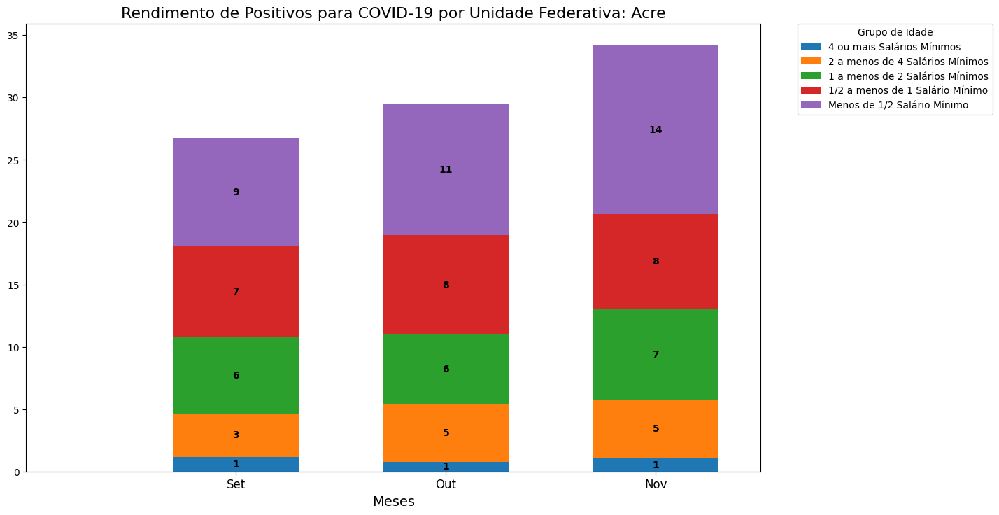

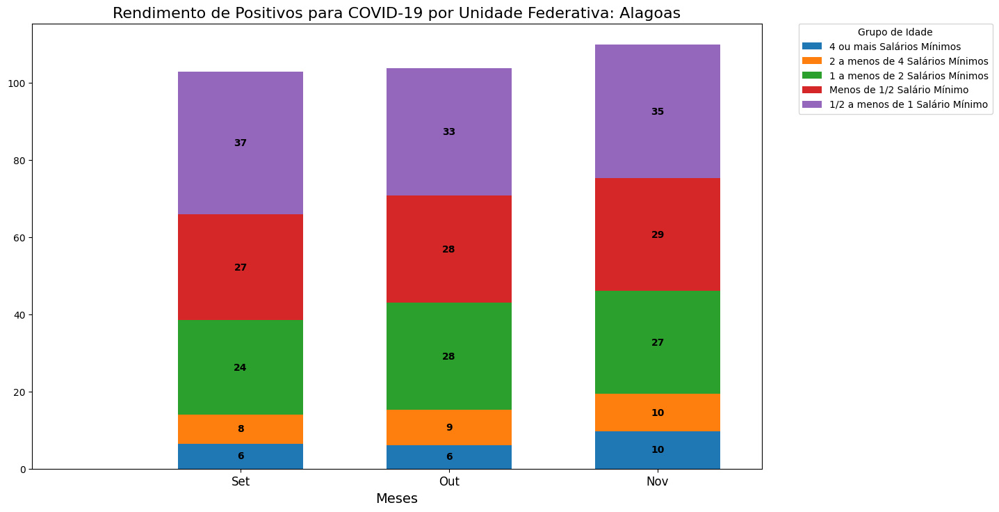

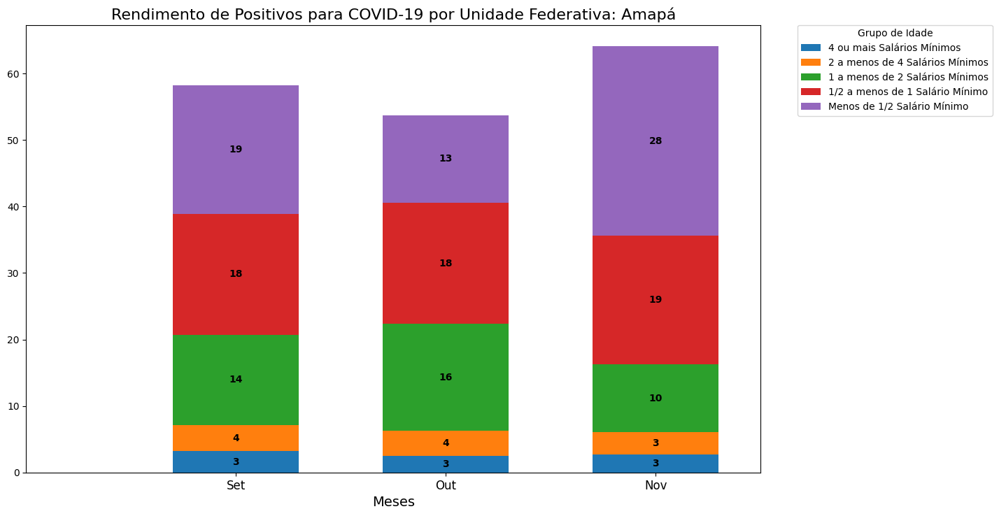

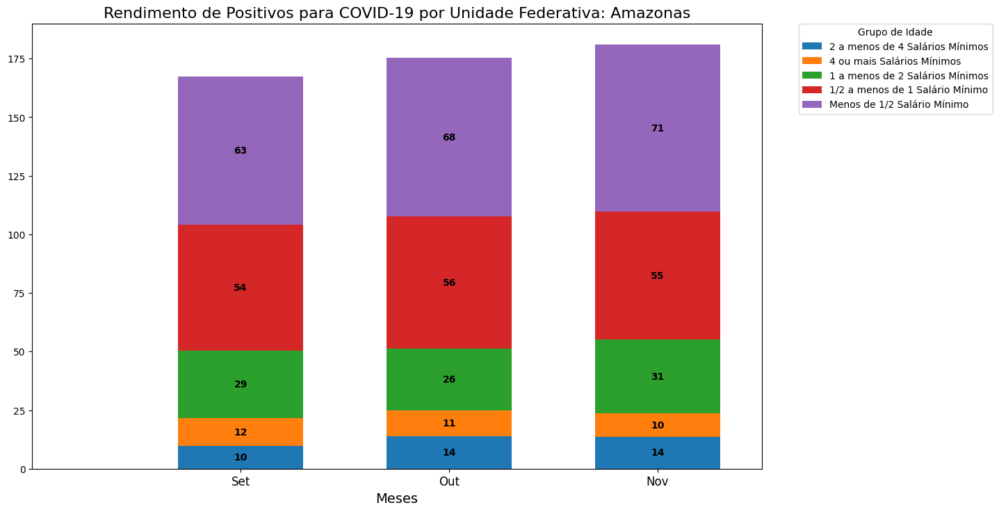

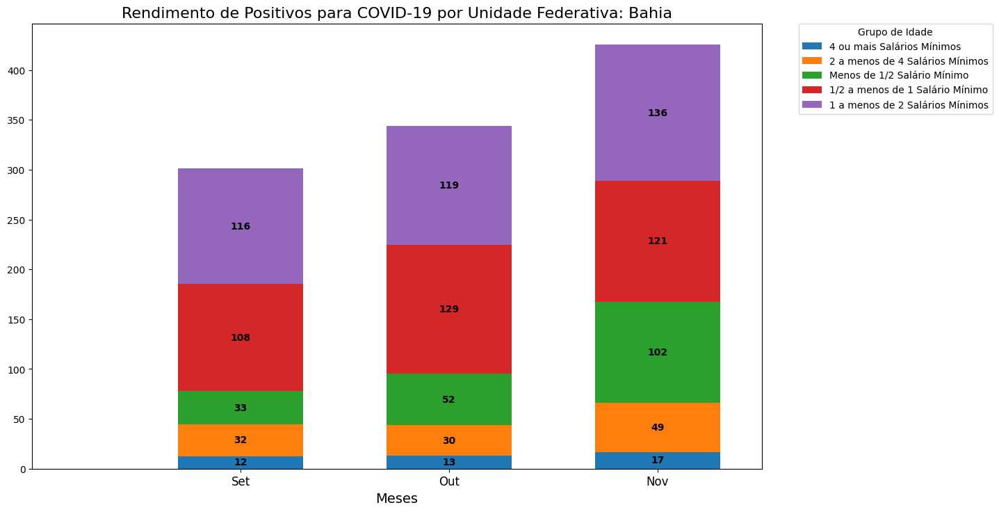

...

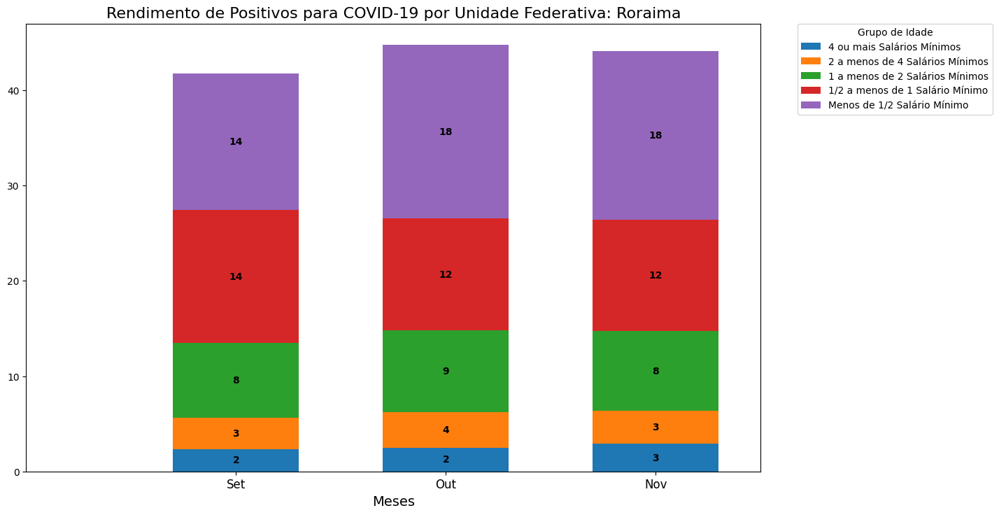

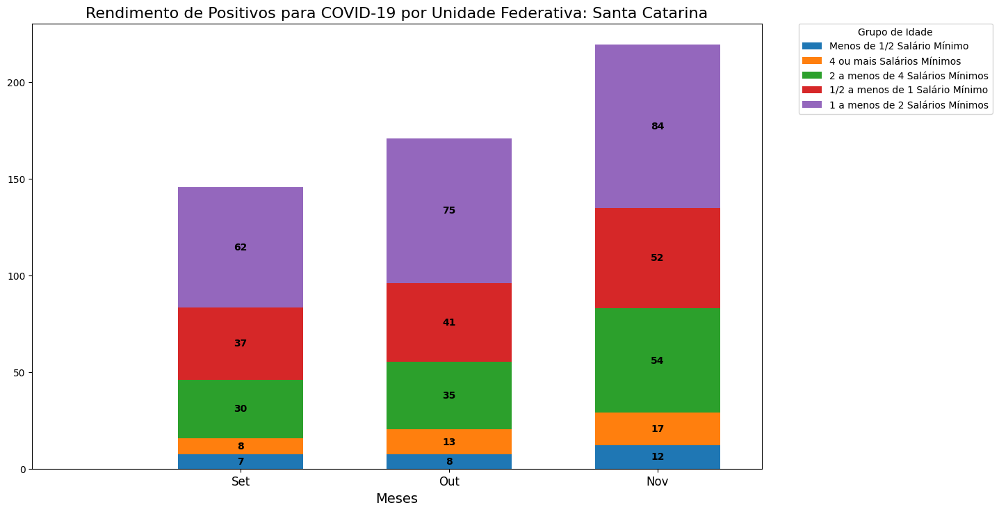

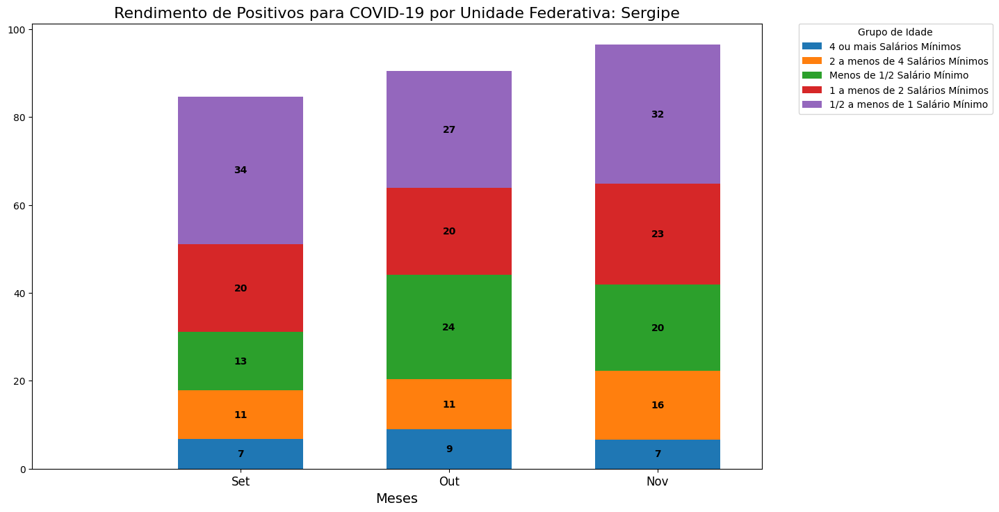

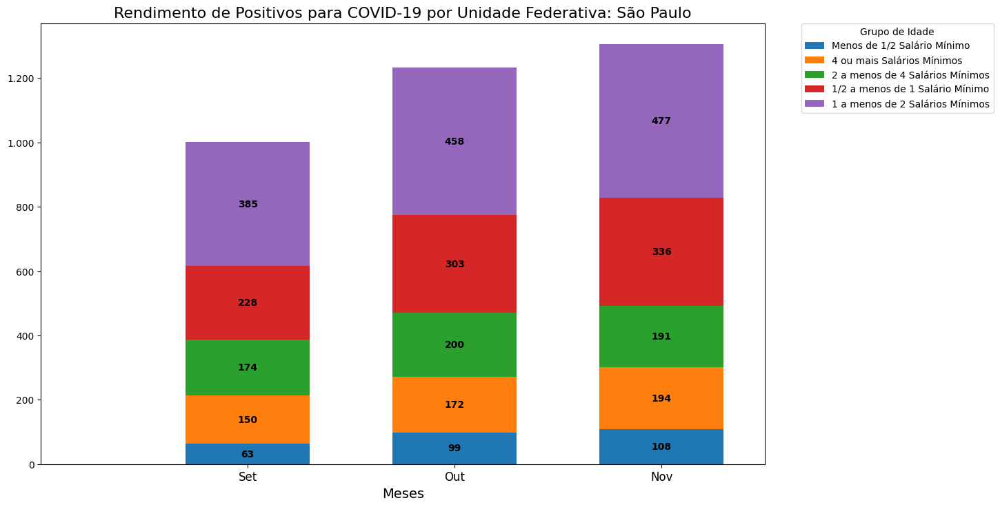

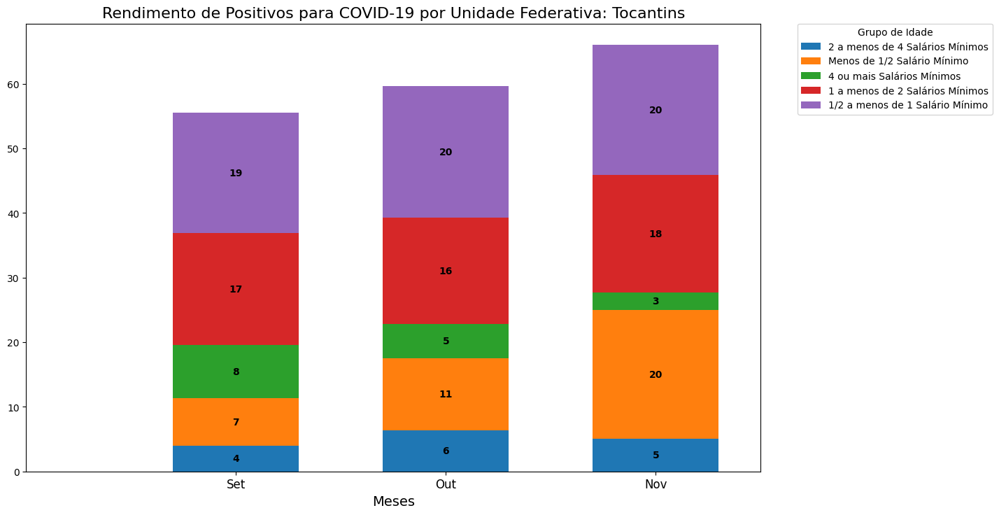

In [ ]:
# Análise de dados utilizando somente o índice 'Pessoas ocupadas (mil pessoas)'
# Loop para criar os gráficos para todos os UF
# for UF1 in df['UF'].unique():
# Dados para o DataFrame
df = df_original[(df_original['Ind'] == 'Pessoas que fizeram algum teste para saber se estavam infectadas pelo Coronavírus e testaram positivo (mil pessoas) ') & (df_original['Var1'] == 'Rendimento real domiciliar per capita efetivamente recebido')]

# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
df = df[df['Cat1'] != 'Total']
df = df[df['Cat1'] != 'Total ']

# Iterar sobre cada valor único de 'UF'
for cat1 in df['UF'].unique():
  # Filtrar o DataFrame para a categoria atual
  subset_cat1 = df[df['UF'] == cat1]

  # Criar o gráfico
  fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

  # Inicializar os valores de "bottom" para empilhar as barras
  bottom_values = np.zeros(len(months))

  # Plotar barras empilhadas para cada categoria de 'Category'
  for ind in subset_cat1['Cat1'].unique():
      subset_ind = subset_cat1[subset_cat1['Cat1'] == ind]
      values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
      bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

      # Adicionar rótulos de dados
      for bar in bars:
          ax.text(
              bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
              bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
              f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
              ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
          )

      # Atualizar os valores do "bottom" para a próxima categoria
      bottom_values += values

  # Adicionar título e rótulos
  ax.set_xlabel('Meses', fontsize=14)
  ax.set_ylabel('', fontsize=14)
  ax.set_title(f'Rendimento de Positivos para COVID-19 por Unidade Federativa: {cat1}', fontsize=16)
  ax.set_xticks(x)
  ax.set_xticklabels(months, fontsize=12)

  # Ajustar os limites do eixo X para deslocar as barras à esquerda
  ax.set_xlim(-1, len(months) - 0.5)

  # Posicionar a legenda na parte direita do gráfico
  ax.legend(title='Grupo de Idade', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

  # Configurar separador de milhar no eixo Y
  ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',','.')))

  # Ajustar margens do gráfico
  plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

  # Exibir o gráfico
  plt.show()


#Comportamento da população na época da COVID-19

In [ ]:
# Building a DataFrame of Clinical Symptoms from DF
df = df_original #Copy original DF data
# Filter the DataFrame
Ocupados_Desocupados_df = df[(df['Nivel'] == 'Unidade da Federação')]

# # Lista de valores para iteração
# var1_values = [
#                 'Cor ou Raça',
#                 'Grupos de Idade',
#                 'Grupos de Idade 2',
#                 'Nível de instrução ',
#                 'Sexo'
#               ]

# # Dicionário para armazenar os resultados
# result_dfs = {}

# # Loop para criar DataFrames filtrados
# for var1 in var1_values:
#     filtered_df = Sintomas_Clinicos_df[Sintomas_Clinicos_df['Var1'] == var1]
#     result_dfs[var1] = filtered_df  # Salvar no dicionário


Ocupados_Desocupados_df = Ocupados_Desocupados_df[Ocupados_Desocupados_df['Ind'].isin([
    'Pessoas ocupadas e não afastadas do trabalho, que trabalhavam de forma remota (mil pessoas)',
    'Pessoas ocupadas e afastadas do trabalho que tinham devido ao distanciamento social (mil pessoas)',
    'Pessoas não ocupadas que não procuraram trabalho por conta da pandemia ou por falta de trabalho na localidade, mas que gostariam de trabalhar na semana anterior (mil pessoas)'
])]

# Dicionário para substituições - Para facilitar leitura da legenda
replace_dict = {
    'Pessoas ocupadas e não afastadas do trabalho, que trabalhavam de forma remota (mil pessoas)':'Trabalhadores remotos não afastados (mil pessoas)',
    'Pessoas ocupadas e afastadas do trabalho que tinham devido ao distanciamento social (mil pessoas)':'Afastados por distanciamento social (mil pessoas):',
    'Pessoas não ocupadas que não procuraram trabalho por conta da pandemia ou por falta de trabalho na localidade, mas que gostariam de trabalhar na semana anterior (mil pessoas)':'Disponíveis, mas não procuraram emprego (mil pessoas):',
}

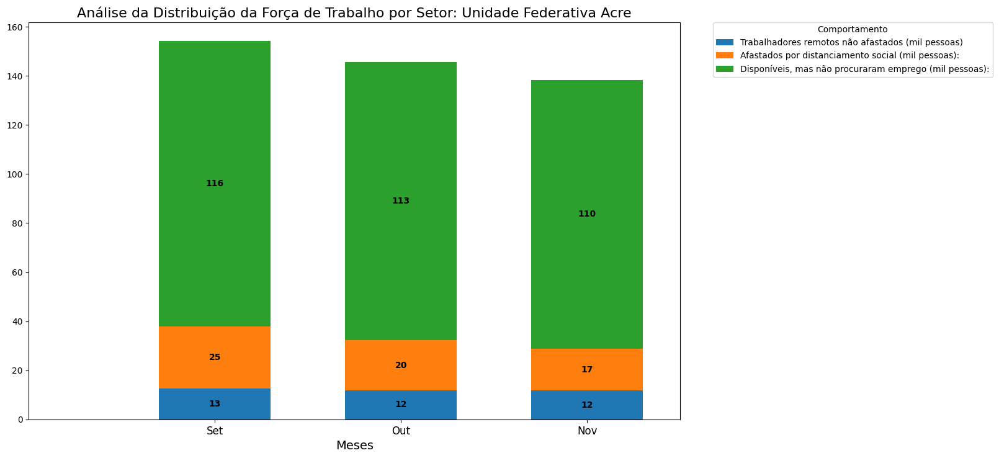

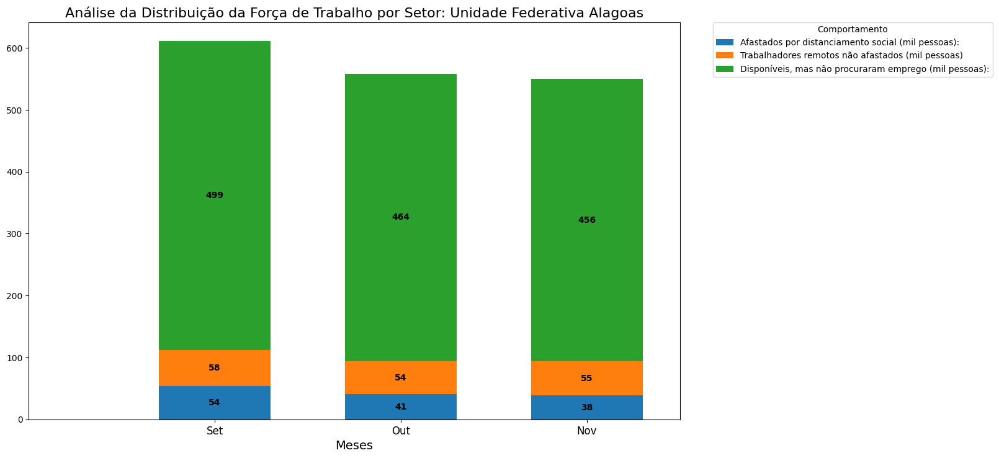

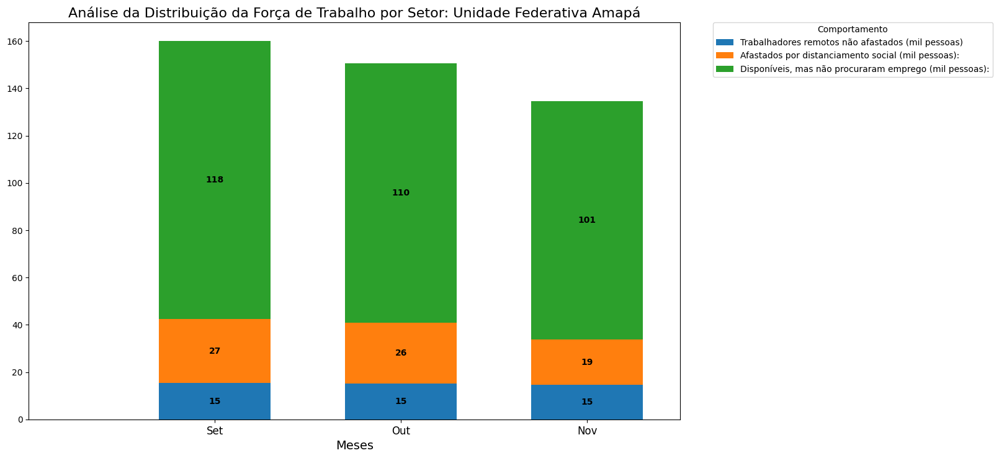

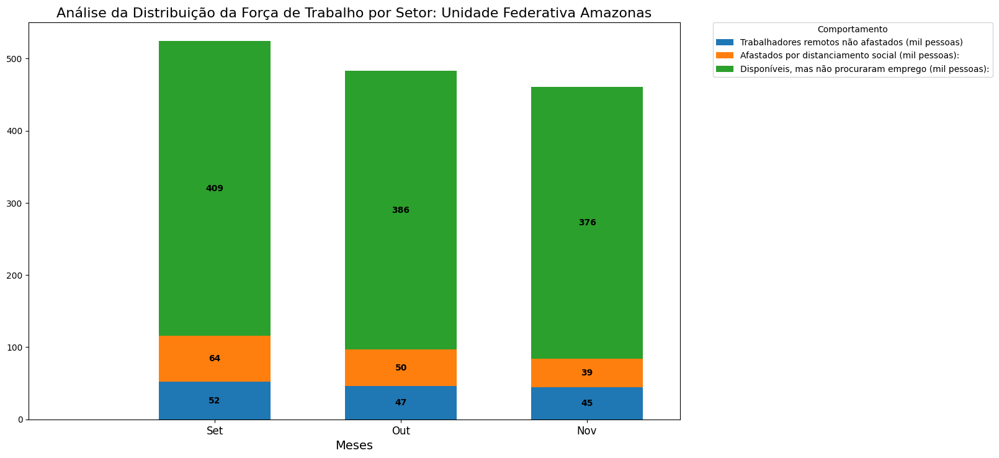

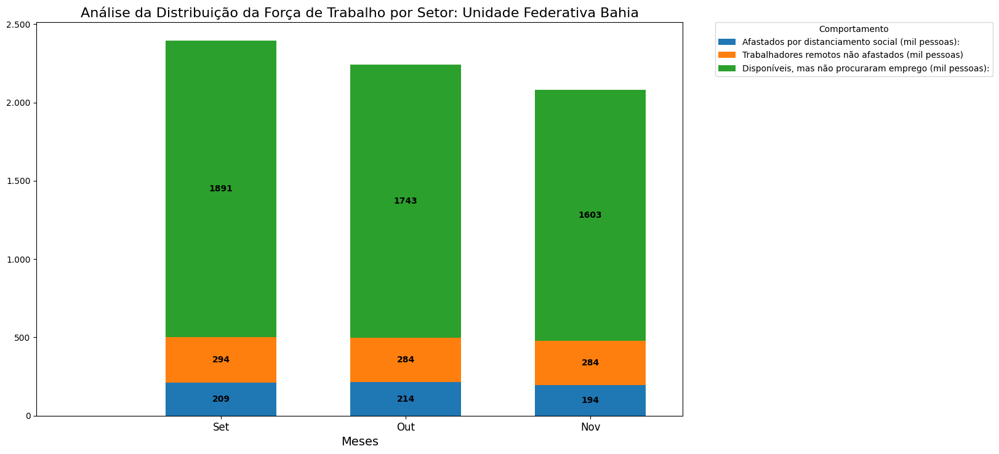

...

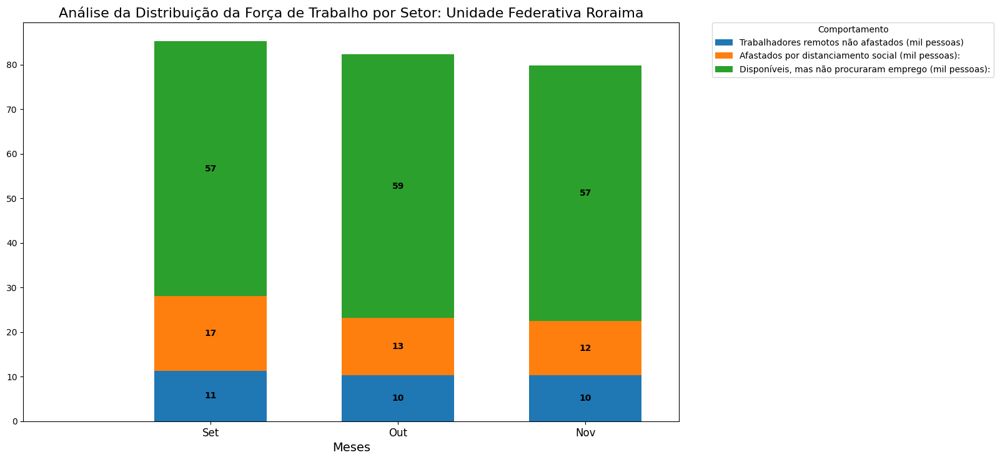

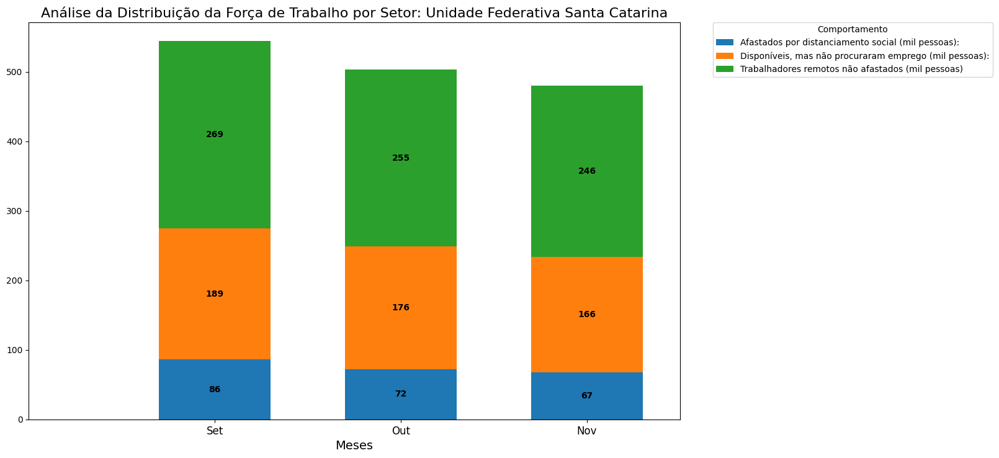

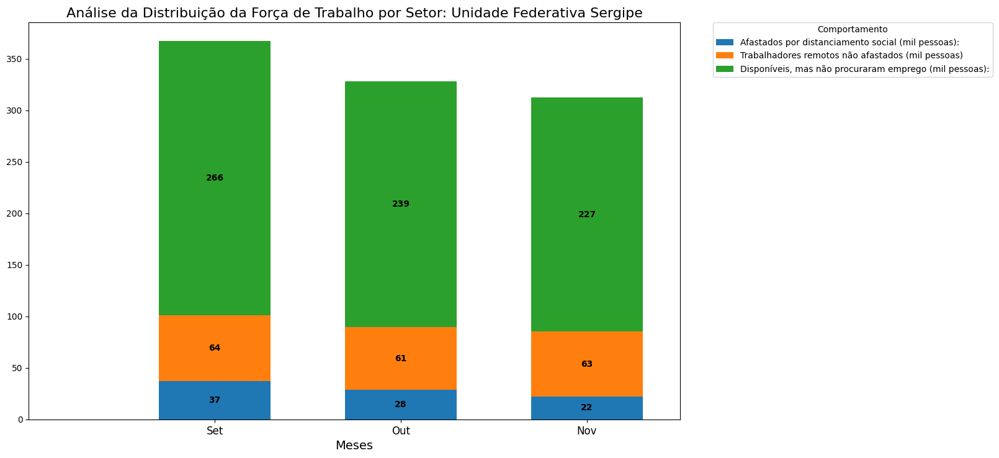

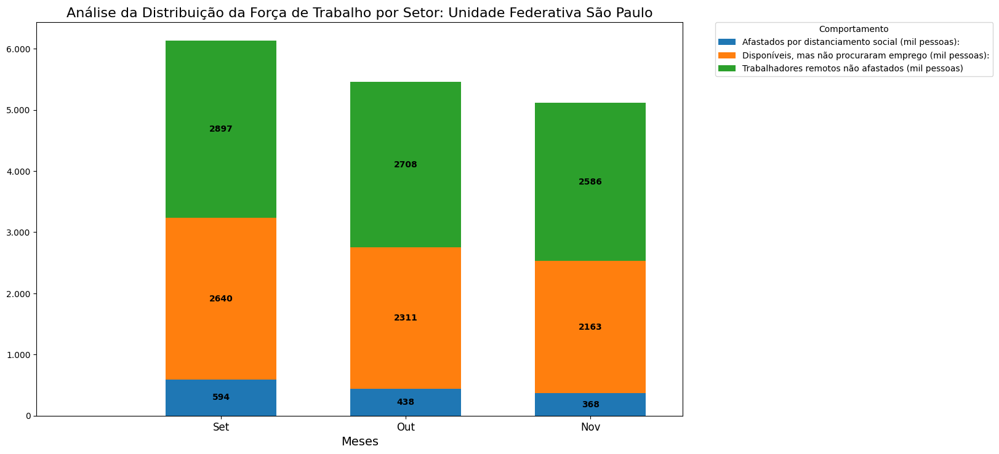

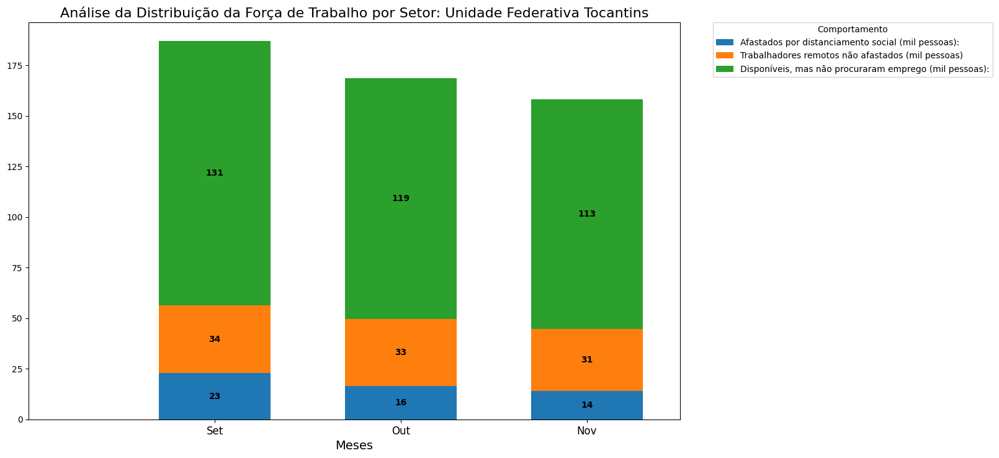

In [ ]:
# Análise de dados utilizando somente o índice 'Pessoas ocupadas e desocupadas (mil pessoas)'
df = Ocupados_Desocupados_df
# Ordenar o DataFrame por 'UF' em ordem crescente
df = df.sort_values(by=['UF','Set','Out','Nov'], ascending=True)

# Substituindo os valores na coluna 'Ind'
df['Ind'] = df['Ind'].replace(replace_dict)

# Filtrar linhas onde Cat1 não é 'Total' - Remove o valor total da tabela de dados colunar
# df = df[df['Cat1'] != 'Total']

# Iterar sobre cada valor único de 'UF'
for cat1 in df['UF'].unique():
  # Filtrar o DataFrame para a categoria atual
  subset_cat1 = df[df['UF'] == cat1]

  # Criar o gráfico
  fig, ax = plt.subplots(figsize=(15, 8))  # Ajustar o tamanho do gráfico

  # Inicializar os valores de "bottom" para empilhar as barras
  bottom_values = np.zeros(len(months))

  # Plotar barras empilhadas para cada categoria de 'Ind'
  for ind in subset_cat1['Ind'].unique():
      subset_ind = subset_cat1[subset_cat1['Ind'] == ind]
      values = subset_ind[['Set', 'Out', 'Nov']].iloc[0].values  # Valores para os meses
      bars = ax.bar(x, values, width, label=ind, bottom=bottom_values)

      # Adicionar rótulos de dados
      for bar in bars:
          ax.text(
              bar.get_x() + bar.get_width() / 2,  # Centralizar horizontalmente
              bar.get_y() + bar.get_height() / 2,  # Centralizar verticalmente
              f'{bar.get_height():.0f}',  # Formatar o valor com 2 casas decimais
              ha='center', va='center', fontsize=10, weight='bold'  # Ajuste de alinhamento e fonte
          )

      # Atualizar os valores do "bottom" para a próxima categoria
      bottom_values += values

  # Adicionar título e rótulos
  ax.set_xlabel('Meses', fontsize=14)
  ax.set_ylabel('', fontsize=14)
  ax.set_title(f'Análise da Distribuição da Força de Trabalho por Setor: Unidade Federativa {cat1}', fontsize=16)
  ax.set_xticks(x)
  ax.set_xticklabels(months, fontsize=12)

  # Ajustar os limites do eixo X para deslocar as barras à esquerda
  ax.set_xlim(-1, len(months) - 0.5)

  # Posicionar a legenda na parte direita do gráfico
  ax.legend(title='Comportamento', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

  # Configurar separador de milhar no eixo Y
  ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'.replace(',','.')))

  # Ajustar margens do gráfico
  plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

  # Exibir o gráfico
  plt.show()
